# Analysis of small DC panel

In this notebook, we analyse three blood samples from healthy human donors measured with flow cytometry. The analysis encompasses data processing, compensation and normalisation, cell type annotation and data visualisation as UMAPs and 2-parameter scatter plots. 

## Load packages

In [1]:
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import datetime
import pytometry as pm
#import pytometrylegacy as pml

sc.logging.print_versions()
sc.settings.verbosity = 3 

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.8.0
scanpy      1.8.1
sinfo       0.3.4
-----
PIL                         8.4.0
anyio                       NA
asciitree                   NA
attr                        21.2.0
babel                       2.9.1
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      1.0.9
certifi                     2021.10.08
cffi                        1.15.0
cftime                      1.5.1
charset_normalizer          2.0.7
cloudpickle 

In [2]:
now = datetime.datetime.now()
today = now.strftime("%Y%m%d")

In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 80))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,35))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Helper functions for the histogram plot.

In [4]:
from matplotlib.scale import SymmetricalLogTransform

MIN_BINS = 500
MAX_BINS = 1000
# utility function for making bins of correct size
def get_bins(min_val, max_val, scaling, linthresh=100):
    w = 1 + max(MIN_BINS, min(MAX_BINS, abs(min_val - max_val) + 1))

    if scaling == 'log':
        return np.logspace(np.log10(min_val), np.log10(max_val), w)
    elif scaling == 'symlog':
        tr = SymmetricalLogTransform(base=10, linthresh=linthresh, linscale=1)

        ss = tr.transform([min_val, max_val])

        ls = tr.inverted().transform(np.linspace(*ss, num=w))
        return ls
    else:# linear
        return np.linspace(min_val, max_val, w)
    
    
def extrema_np(arr):
    return  np.min(arr),np.max(arr)

Define helper compensation function.

In [5]:
from pytometry.preprocessing import create_comp_mat
from anndata import AnnData

def compensate(
    adata: AnnData,
    comp_matrix: pd.DataFrame = None,
    matrix_type: str = "spillover",
    inplace: bool = True,
):
    """Computes compensation for data channels.

    Args:
        adata (AnnData): AnnData object
        key (str, optional): key where result vector is added
            to the adata.var. Defaults to 'signal_type'.
        comp_matrix (pd.DataFrame, optional): a custom compensation matrix.
            Please note that by default we use the spillover matrix directly
            for numeric stability.
        matrix_type (str, optional): whether to use a spillover matrix (default)
            or a compensation matrix. Only considered for custom compensation matrices.
            Usually, custom compensation matrices are the inverse of the spillover
            matrix.
            If you want to use a compensation matrix, not the spillover matrix,
            set `matrix_type` to `compensation`.
        inplace (bool, optional): Return a copy instead of writing to adata.
            Defaults to True.

    Returns:
        Depending on `inplace`, returns or updates `adata`
    """
    adata = adata if inplace else adata.copy()

    # locate compensation matrix
    if comp_matrix is not None:
        if matrix_type == "spillover":
            compens = comp_matrix
        elif matrix_type == "compensation":
            compens = create_comp_mat(comp_matrix)
        else:
            raise KeyError(
                "Expected 'spillover' or 'compensation' as `matrix_type`, but got"
                f" '{matrix_type}'."
            )
        # To Do: add checks that this input is correct
    elif adata.uns["meta"]["spill"] is not None:
        compens = adata.uns["meta"]["spill"]
    else:
        raise KeyError(f"Did not find .uns['meta']['spill'] nor '{comp_matrix}'.")

    # save original data as layer
    if "original" not in adata.layers:
        adata.layers["original"] = adata.X.copy()

    # Ignore channels 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A',
    # 'FSC-Width', 'Time'
    # and compensate only the values indicated in the compensation matrix
    # Note:
    # the compensation matrix may have different index names than the adata.X matrix
    ref_col = adata.var.index
    idx_in = np.intersect1d(compens.columns, ref_col)
    if not idx_in.any():
        # try the adata.var['channel'] as reference
        ref_col = adata.var["channel"]
        idx_in = np.intersect1d(compens.columns, ref_col)
        if not idx_in.any():
            raise ValueError(
                "Could not match the column names of the compensation matrix"
                'with neither `adata.var.index` nor `adata.var["channel"].'
            )
    # match columns of spill mat such that they exactly correspond to adata.var.index
    ref_names = ref_col[np.in1d(ref_col, idx_in)]
    query_names = compens.columns[np.in1d(compens.columns, idx_in)]
    idx_sort = [np.where(query_names == x)[0][0] for x in ref_names]
    query_idx = np.in1d(compens.columns, query_names)
    ref_idx = np.in1d(ref_col, ref_names)

    # subset compensation matrix to the columns to run the compensation on
    compens = compens.iloc[query_idx, query_idx]
    # sort compensation matrix by adata.var_names
    compens = compens.iloc[idx_sort, idx_sort]
    X_comp = np.linalg.solve(compens.T, adata.X[:, ref_idx].T).T

    X = adata.X.copy()
    adata.X[:, ref_idx] = X_comp

    if np.array_equal(X, adata.X):
        print(
            "Compensation failed - matrices before and after are equivalent. Please"
            " check your compensation matrix."
        )
    del X

    # check for nan values
    nan_val = np.isnan(adata.X[:, ref_idx]).sum()
    if nan_val > 0:
        print(
            f"{nan_val} NaN values found after compensation. Please adjust "
            "compensation matrix."
        )

    return None if inplace else adata

Set parameters for vector friendly figures.

In [22]:
sc.set_figure_params(vector_friendly=True, dpi_save=150)

# Introduction

In this notebook, we pre-process flow data of blood samples from healthy donors. Data were provided by Thomas Hofer of the IMA (Helmholtz Center Munich). 
We employ the following steps:
1. Load and convert fcs file into anndata format
2. Compensate for channel bleedthrough
3. Biexponential normalisation 
4. Compute knn-graph
5. Compute Leiden clustering
6. Annotate based on clustering. 


## Load data from `fcs` file.

In [5]:
data_path = './../data/Hofer_IMA/FCS_FJ_files/'

In [6]:
adatas = []

### Load KR sample

In [8]:
file = data_path +  'KR full.fcs'

Read in fcs file using `pytometry`.

In [9]:
adata = pm.io.read_fcs(file)

In [10]:
adata.obs['sample'] = 'KR'

In [11]:
adata

AnnData object with n_obs × n_vars = 790217 × 18
    obs: 'sample'
    var: 'channel', 'marker'
    uns: 'meta'

In [12]:
adata.var

,channel,marker
FSC-H,FSC-H,FSC-H
FSC-A,FSC-A,FSC-A
SSC-H,SSC-H,SSC-H
SSC-A,SSC-A,SSC-A
CD14-FITC B525-FITC-H,FL1-H,CD14-FITC B525-FITC-H
CD14-FITC B525-FITC-A,FL1-A,CD14-FITC B525-FITC-A
CD1c-PE Y585-PE-H,FL4-H,CD1c-PE Y585-PE-H
CD1c-PE Y585-PE-A,FL4-A,CD1c-PE Y585-PE-A
HLA-DR-PE-Cy5 Y675-PC5-H,FL6-H,HLA-DR-PE-Cy5 Y675-PC5-H
HLA-DR-PE-Cy5 Y675-PC5-A,FL6-A,HLA-DR-PE-Cy5 Y675-PC5-A


We see that the FACS data object contains several types of information. 4 channels are reserved for forward scatter and side scatter information. Furthermore, we have an `FSC-Width` and `Time` channel. These do not contribute to the fluorescent signal. In addition, we only consider the `Area` parameter (A), and neclect the `height` parameter (H).

Create an `anndata` object from FACS data without the 6 channels that have nothing to do with fluorescence. We add those to the metadata.

In [13]:
pm.pp.split_signal(adata, option='area')

In [14]:
adata.var

,channel,marker,signal_type
CD14-FITC B525-FITC-A,FL1-A,CD14-FITC B525-FITC-A,area
CD1c-PE Y585-PE-A,FL4-A,CD1c-PE Y585-PE-A,area
HLA-DR-PE-Cy5 Y675-PC5-A,FL6-A,HLA-DR-PE-Cy5 Y675-PC5-A,area
CD16-APC R660-APC-A,FL9-A,CD16-APC R660-APC-A,area
CD19-20-AF700 R712-APCA700-A,FL10-A,CD19-20-AF700 R712-APCA700-A,area
CD5-BV711 V763-A,FL16-A,CD5-BV711 V763-A,area


In [15]:
comp_matrix = adata.uns['meta']['spill'].iloc[6:, 6:]

In [17]:
comp_matrix.T

,CD14-FITC B525-FITC-A,CD1c-PE Y585-PE-A,HLA-DR-PE-Cy5 Y675-PC5-A,CD16-APC R660-APC-A,CD19-20-AF700 R712-APCA700-A,CD5-BV711 V763-A
CD14-FITC B525-FITC-A,1.000000,0.001928,0.000236,0.000000,0.000000,0.000000
CD1c-PE Y585-PE-A,0.001924,1.000000,0.002241,0.000000,0.000137,0.000150
HLA-DR-PE-Cy5 Y675-PC5-A,0.000000,0.053791,1.000000,0.597126,0.047502,0.004049
CD16-APC R660-APC-A,0.001000,0.005000,0.035000,1.000000,0.016160,0.001388
CD19-20-AF700 R712-APCA700-A,0.001382,0.000000,0.069112,0.644304,1.000000,0.356486
CD5-BV711 V763-A,0.002144,0.002369,0.105931,0.013351,0.012106,1.000000


Correct compensation matrix according to the collaborator feedback in November 2023 and February 2024.

In [18]:
comp_matrix.iloc[3,2] = 0.39
comp_matrix.iloc[2,3] = 0.09
comp_matrix.iloc[4,3] = 0.008
comp_matrix.iloc[3,4] = 0.64
comp_matrix.iloc[5,4] = 0.3
comp_matrix.iloc[2,5] = 0.04
comp_matrix.iloc[3,5] = 0.055
comp_matrix.iloc[4,5] = 0.09

In [19]:
comp_matrix

,CD14-FITC B525-FITC-A,CD1c-PE Y585-PE-A,HLA-DR-PE-Cy5 Y675-PC5-A,CD16-APC R660-APC-A,CD19-20-AF700 R712-APCA700-A,CD5-BV711 V763-A
CD14-FITC B525-FITC-A,1.000000,0.001924,0.000000,0.001000,0.001382,0.002144
CD1c-PE Y585-PE-A,0.001928,1.000000,0.053791,0.005000,0.000000,0.002369
HLA-DR-PE-Cy5 Y675-PC5-A,0.000236,0.002241,1.000000,0.090000,0.069112,0.040000
CD16-APC R660-APC-A,0.000000,0.000000,0.390000,1.000000,0.640000,0.055000
CD19-20-AF700 R712-APCA700-A,0.000000,0.000137,0.047502,0.008000,1.000000,0.090000
CD5-BV711 V763-A,0.000000,0.000150,0.004049,0.001388,0.300000,1.000000


Do compensation on all variables, except for forward and sideward scatter as well as time.

In [20]:
compensate(adata, comp_matrix = comp_matrix)

In [21]:
adata

AnnData object with n_obs × n_vars = 790217 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time'
    var: 'channel', 'marker', 'signal_type'
    uns: 'meta'
    layers: 'original'

Before we normalize using the `arcsinh`, we save the non-normalised data as layer.

In [22]:
adata.layers['compensated'] = adata.X.copy()

Read transformation from FlowJo files.

In [23]:
params = pd.read_csv(data_path + 'workspace_hofer_params_KR full.fcs_0000000000790217.csv', 
                     index_col = 0)

In [24]:
rename_col = [idx.split('parameters.')[-1] for idx in params.columns.values]

In [25]:
params.columns = rename_col

Use only 'area' parameter.

In [26]:
params = params.loc[[channel.endswith('-A') for channel in params.index]]

Create dictionary for index renaming in the params, assuming that the `channel_data` have the same order.

In [29]:
channel_renames = dict(zip(adata.var['channel'].values, 
                           adata.var['marker'].values))

In [30]:
params.index = params.index.map(channel_renames)

Use biexponential normalisation.

In [31]:
pm.tl.normalize_biExp(adata, negative = params['neg'], 
                      positive = params['pos'], 
                      width = params['widthBasis'],
                      max_value = params['maxValue'] 
                      )

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


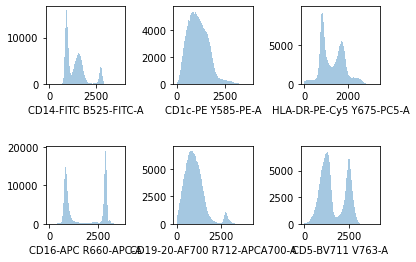

In [33]:
pm.pl.plotdata(adata,
               # save = '/Users/buettnerm/Documents/Projects/Pytometry/test.pdf')
              )

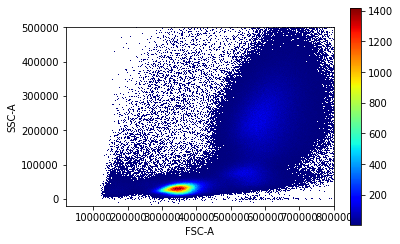

In [34]:
pm.pl.scatter_density(adata, x_lim=[20000.0, 800000.0], y_lim=[-20000.0, 500000.0])

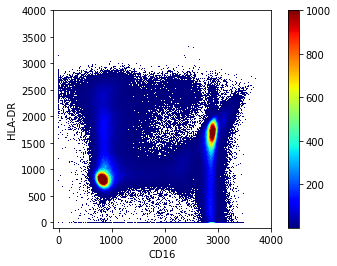

In [35]:
pm.pl.scatter_density(adata, x='CD16-APC R660-APC-A', y='HLA-DR-PE-Cy5 Y675-PC5-A',
                      x_label='CD16', y_label='HLA-DR',
                      x_lim=[-100, 4000.0], y_lim=[-100.0, 4000.0], vmax=1000
                     )

Read gating information from FlowJo.

In [36]:
gate_df = pd.read_csv(data_path + 'workspace_hofer_gate_KR full.csv', index_col=0)

In [37]:
gate_df.head()

,Time,root,LymphoMono,non B-cells,singlets,non HLA-DR,CD1c+,"Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+","Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+","Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-","Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-",class. Mono,intermed. Mono,non-class. Mono
1,0.00000,1,1,1,1,0,0,0,0,0,0,0,0,0
2,0.00056,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0.00064,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0.00074,1,1,1,1,0,0,0,0,0,0,0,0,0
5,0.00210,1,0,0,0,0,0,0,0,0,0,0,0,0


Interestingly, the 'Time' covariate in the FlowJo sample was divided by 50,000. 

In [39]:
adata.obs['Time']/50000

0           0.000000
1           0.000560
2           0.000640
3           0.000740
4           0.002100
             ...    
790212    474.402008
790213    474.402161
790214    474.402679
790215    474.403320
790216    474.405426
Name: Time, Length: 790217, dtype: float32

In [40]:
adata.obs['Time'] = adata.obs['Time']/50000

Do the Time features match in both tables?

In [41]:
counts = list()
for idx in range(adata.n_obs):
    counts.append( np.diff([adata.obs['Time'][idx], gate_df['Time'].loc[idx+1]]))

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

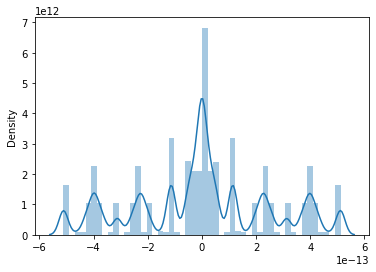

In [42]:
sb.distplot(counts)

That result is not really representing what I had in mind when I wanted to use the "Time" column as index for merging the two data frames, but it is close enough to rest assured that I actually matched the right cells. 

In [45]:
for col in gate_df.columns[1:]:
    adata.obs['gate_' + col] = gate_df.loc[:,gate_df.columns==col].values.flatten()

In [46]:
adata

AnnData object with n_obs × n_vars = 790217 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time', 'gate_root', 'gate_LymphoMono', 'gate_non B-cells', 'gate_singlets', 'gate_non HLA-DR', 'gate_CD1c+', 'gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+', 'gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+', 'gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-', 'gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-', 'gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono'
    var: 'channel', 'marker', 'signal_type'
    uns: 'meta'
    layers: 'original', 'compensated'

In [47]:
adatas.append(adata)

### Load KW sample.

In [48]:
file = data_path +  'KW full.fcs'

Read in fcs file using `pytometry`.

In [49]:
adata = pm.io.read_fcs(file)

In [50]:
adata.obs['sample'] = 'KW'

In [51]:
adata

AnnData object with n_obs × n_vars = 1119954 × 18
    obs: 'sample'
    var: 'channel', 'marker'
    uns: 'meta'

In [52]:
adata.var

,channel,marker
FSC-H,FSC-H,FSC-H
FSC-A,FSC-A,FSC-A
SSC-H,SSC-H,SSC-H
SSC-A,SSC-A,SSC-A
CD14-FITC B525-FITC-H,FL1-H,CD14-FITC B525-FITC-H
CD14-FITC B525-FITC-A,FL1-A,CD14-FITC B525-FITC-A
CD1c-PE Y585-PE-H,FL4-H,CD1c-PE Y585-PE-H
CD1c-PE Y585-PE-A,FL4-A,CD1c-PE Y585-PE-A
HLA-DR-PE-Cy5 Y675-PC5-H,FL6-H,HLA-DR-PE-Cy5 Y675-PC5-H
HLA-DR-PE-Cy5 Y675-PC5-A,FL6-A,HLA-DR-PE-Cy5 Y675-PC5-A


Get compensation matrix and manually adjust it.

In [53]:
comp_matrix = adata.uns['meta']['spill'].iloc[6:, 6:]

In [54]:
comp_matrix

,CD14-FITC B525-FITC-A,CD1c-PE Y585-PE-A,HLA-DR-PE-Cy5 Y675-PC5-A,CD16-APC R660-APC-A,CD19-20-AF700 R712-APCA700-A,CD5-BV711 V763-A
CD14-FITC B525-FITC-A,1.0000,0.0019,0.0000,0.0010,0.0014,0.0021
CD1c-PE Y585-PE-A,0.0019,1.0000,0.0538,0.0050,0.0000,0.0024
HLA-DR-PE-Cy5 Y675-PC5-A,0.0002,0.0022,1.0000,0.0350,0.0691,0.1059
CD16-APC R660-APC-A,0.0000,0.0000,0.5971,1.0000,0.6443,0.0134
CD19-20-AF700 R712-APCA700-A,0.0000,0.0001,0.0475,0.0162,1.0000,0.0121
CD5-BV711 V763-A,0.0000,0.0002,0.0040,0.0014,0.3565,1.0000


Correct compensation matrix according to the collaborator feedback in November 2023 and February 2024.

In [55]:
comp_matrix.iloc[3,2] = 0.39
comp_matrix.iloc[2,3] = 0.09
comp_matrix.iloc[4,3] = 0.008
comp_matrix.iloc[3,4] = 0.64
comp_matrix.iloc[5,4] = 0.3
comp_matrix.iloc[2,5] = 0.04
comp_matrix.iloc[3,5] = 0.055
comp_matrix.iloc[4,5] = 0.09

In [56]:
comp_matrix

,CD14-FITC B525-FITC-A,CD1c-PE Y585-PE-A,HLA-DR-PE-Cy5 Y675-PC5-A,CD16-APC R660-APC-A,CD19-20-AF700 R712-APCA700-A,CD5-BV711 V763-A
CD14-FITC B525-FITC-A,1.0000,0.0019,0.0000,0.0010,0.0014,0.0021
CD1c-PE Y585-PE-A,0.0019,1.0000,0.0538,0.0050,0.0000,0.0024
HLA-DR-PE-Cy5 Y675-PC5-A,0.0002,0.0022,1.0000,0.0900,0.0691,0.0400
CD16-APC R660-APC-A,0.0000,0.0000,0.3900,1.0000,0.6400,0.0550
CD19-20-AF700 R712-APCA700-A,0.0000,0.0001,0.0475,0.0080,1.0000,0.0900
CD5-BV711 V763-A,0.0000,0.0002,0.0040,0.0014,0.3000,1.0000


Do compensation on all variables, except for forward and sideward scatter as well as time.

In [57]:
compensate(adata, comp_matrix=comp_matrix)

We see that the FACS data object contains several types of information. 4 channels are reserved for forward scatter and side scatter information. Furthermore, we have an `FSC-Width` and `Time` channel. These do not contribute to the fluorescent signal. In addition, we only consider the `Area` parameter (A), and neclect the `height` parameter (H).

Create an `anndata` object from FACS data without the 6 channels that have nothing to do with fluorescence. We add those to the metadata.

In [58]:
pm.pp.split_signal(adata, option='area')

Before we normalize using the `arcsinh`, we save the non-normalised data as layer.

In [59]:
adata.layers['compensated'] = adata.X.copy()

Read transformation from FlowJo files.

In [60]:
params = pd.read_csv(data_path + 'workspace_hofer_params_KW full.fcs_0000000001119954.csv', 
                     index_col = 0)

In [61]:
rename_col = [idx.split('parameters.')[-1] for idx in params.columns.values]

In [62]:
params.columns = rename_col

Use only 'area' parameter.

In [63]:
params = params.loc[[channel.endswith('-A') for channel in params.index]]

Create dictionary for index renaming in the params, assuming that the `channel_data` have the same order.

In [66]:
channel_renames = dict(zip(adata.var['channel'].values, 
                           adata.var['marker'].values))

In [67]:
params.index = params.index.map(channel_renames)

Use biexponential normalisation.

In [68]:
pm.tl.normalize_biExp(adata, negative = params['neg'], 
                      positive = params['pos'], 
                      width = params['widthBasis'],
                      max_value = params['maxValue'] 
                      )

In [69]:
adata

AnnData object with n_obs × n_vars = 1119954 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time'
    var: 'channel', 'marker', 'signal_type'
    uns: 'meta'
    layers: 'original', 'compensated'

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


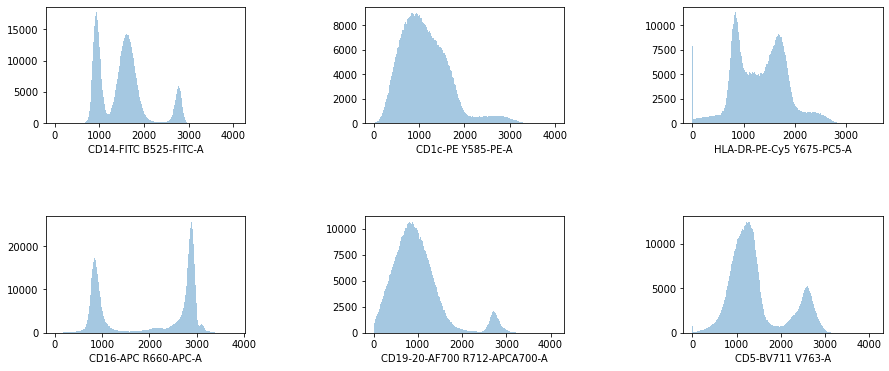

In [70]:
pm.pl.plotdata(adata,
               # save = '/Users/buettnerm/Documents/Projects/Pytometry/test.pdf')
              )

Read gating information from FlowJo.

In [71]:
gate_df = pd.read_csv(data_path + 'workspace_hofer_gate_KW full.csv', index_col=0)

/home/buettnerm/.local/lib/python3.8/site-packages/numpy/lib/arraysetops.py:583: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [73]:
gate_df.shape

(1119954, 14)

Interestingly, the 'Time' covariate in the FlowJo sample was divided by 50,000. 

In [74]:
adata.obs['Time']/50000

0            0.000000
1            0.000260
2            0.000620
3            0.001080
4            0.001460
              ...    
1119949    432.093994
1119950    432.094971
1119951    432.095123
1119952    432.096252
1119953    432.096313
Name: Time, Length: 1119954, dtype: float32

In [75]:
adata.obs['Time'] = adata.obs['Time']/50000

Do the Time features match in both tables?

In [76]:
counts = list()
for idx in range(adata.n_obs):
    counts.append( np.diff([adata.obs['Time'][idx], gate_df['Time'].loc[idx+1]]))

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

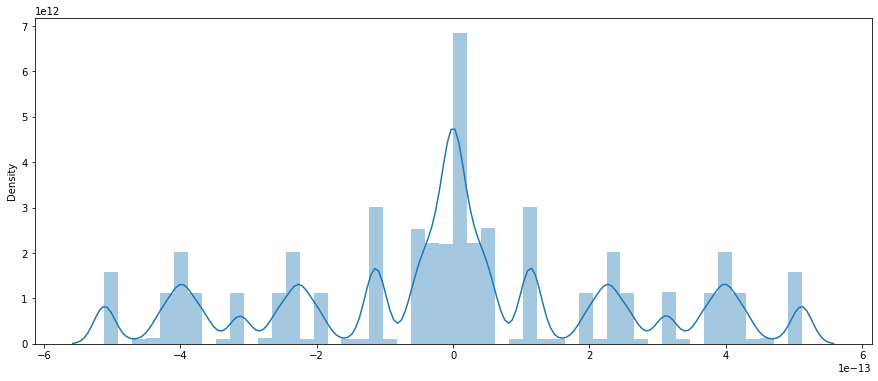

In [77]:
sb.distplot(counts)

In [78]:
np.round(counts, decimals = 3).sum() 

0.0

That result is not really representing what I had in mind when I wanted to use the "Time" column as index for merging the two data frames, but it is close enough to rest assured that I actually matched the right cells. 

In [80]:
for col in gate_df.columns[1:]:
    adata.obs['gate_' + col] = gate_df.loc[:,gate_df.columns==col].values.flatten()

In [81]:
adata

AnnData object with n_obs × n_vars = 1119954 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time', 'gate_root', 'gate_LymphoMono', 'gate_non B-cells', 'gate_singlets', 'gate_non HLA-DR', 'gate_CD1c+', 'gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+', 'gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+', 'gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-', 'gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-', 'gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono'
    var: 'channel', 'marker', 'signal_type'
    uns: 'meta'
    layers: 'original', 'compensated'

In [82]:
adatas.append(adata)

### Load MF sample.

In [83]:
file = data_path +  'MF full.fcs'

Read in fcs file using `pytometry`.

In [84]:
adata = pm.io.read_fcs(file)

In [85]:
adata.obs['sample'] = 'MF'

In [86]:
adata

AnnData object with n_obs × n_vars = 954538 × 18
    obs: 'sample'
    var: 'channel', 'marker'
    uns: 'meta'

In [87]:
adata.var

,channel,marker
FSC-H,FSC-H,FSC-H
FSC-A,FSC-A,FSC-A
SSC-H,SSC-H,SSC-H
SSC-A,SSC-A,SSC-A
CD14-FITC B525-FITC-H,FL1-H,CD14-FITC B525-FITC-H
CD14-FITC B525-FITC-A,FL1-A,CD14-FITC B525-FITC-A
CD1c-PE Y585-PE-H,FL4-H,CD1c-PE Y585-PE-H
CD1c-PE Y585-PE-A,FL4-A,CD1c-PE Y585-PE-A
HLA-DR-PE-Cy5 Y675-PC5-H,FL6-H,HLA-DR-PE-Cy5 Y675-PC5-H
HLA-DR-PE-Cy5 Y675-PC5-A,FL6-A,HLA-DR-PE-Cy5 Y675-PC5-A


Get compensation matrix and adjust ist manually.

In [88]:
comp_matrix = adata.uns['meta']['spill'].iloc[6:, 6:]

In [89]:
comp_matrix

,CD14-FITC B525-FITC-A,CD1c-PE Y585-PE-A,HLA-DR-PE-Cy5 Y675-PC5-A,CD16-APC R660-APC-A,CD19-20-AF700 R712-APCA700-A,CD5-BV711 V763-A
CD14-FITC B525-FITC-A,1.000000,0.001924,0.000000,0.001000,0.001382,0.002144
CD1c-PE Y585-PE-A,0.001928,1.000000,0.053791,0.005000,0.000000,0.002369
HLA-DR-PE-Cy5 Y675-PC5-A,0.000236,0.002241,1.000000,0.035000,0.069112,0.105931
CD16-APC R660-APC-A,0.000000,0.000000,0.597126,1.000000,0.644304,0.013351
CD19-20-AF700 R712-APCA700-A,0.000000,0.000137,0.047502,0.016160,1.000000,0.012106
CD5-BV711 V763-A,0.000000,0.000150,0.004049,0.001388,0.356486,1.000000


Correct compensation matrix according to the collaborator feedback in November 2023 and February 2024.

In [90]:
comp_matrix.iloc[3,2] = 0.39
comp_matrix.iloc[2,3] = 0.09
comp_matrix.iloc[4,3] = 0.008
comp_matrix.iloc[3,4] = 0.64
comp_matrix.iloc[5,4] = 0.3
comp_matrix.iloc[2,5] = 0.04
comp_matrix.iloc[3,5] = 0.055
comp_matrix.iloc[4,5] = 0.09

In [91]:
comp_matrix

,CD14-FITC B525-FITC-A,CD1c-PE Y585-PE-A,HLA-DR-PE-Cy5 Y675-PC5-A,CD16-APC R660-APC-A,CD19-20-AF700 R712-APCA700-A,CD5-BV711 V763-A
CD14-FITC B525-FITC-A,1.000000,0.001924,0.000000,0.001000,0.001382,0.002144
CD1c-PE Y585-PE-A,0.001928,1.000000,0.053791,0.005000,0.000000,0.002369
HLA-DR-PE-Cy5 Y675-PC5-A,0.000236,0.002241,1.000000,0.090000,0.069112,0.040000
CD16-APC R660-APC-A,0.000000,0.000000,0.390000,1.000000,0.640000,0.055000
CD19-20-AF700 R712-APCA700-A,0.000000,0.000137,0.047502,0.008000,1.000000,0.090000
CD5-BV711 V763-A,0.000000,0.000150,0.004049,0.001388,0.300000,1.000000


Do compensation on all variables, except for forward and sideward scatter as well as time.

In [92]:
compensate(adata, comp_matrix=comp_matrix)

We see that the FACS data object contains several types of information. 4 channels are reserved for forward scatter and side scatter information. Furthermore, we have an `FSC-Width` and `Time` channel. These do not contribute to the fluorescent signal. In addition, we only consider the `Area` parameter (A), and neclect the `height` parameter (H).

Create an `anndata` object from FACS data without the 6 channels that have nothing to do with fluorescence. We add those to the metadata.

In [93]:
pm.pp.split_signal(adata, option='area')

Before we normalize using the `arcsinh`, we save the non-normalised data as layer.

In [94]:
adata.layers['compensated'] = adata.X.copy()

Read transformation from FlowJo files.

In [95]:
params = pd.read_csv(data_path + 'workspace_hofer_params_MF full.fcs_0000000000954538.csv', 
                     index_col = 0)

In [96]:
rename_col = [idx.split('parameters.')[-1] for idx in params.columns.values]

In [97]:
params.columns = rename_col

Use only 'area' parameter.

In [98]:
params = params.loc[[channel.endswith('-A') for channel in params.index]]

Create dictionary for index renaming in the params, assuming that the `channel_data` have the same order.

In [101]:
channel_renames = dict(zip(adata.var['channel'].values, 
                           adata.var['marker'].values))

In [102]:
params.index = params.index.map(channel_renames)

Use biexponential normalisation.

In [103]:
pm.tl.normalize_biExp(adata, negative = params['neg'], 
                      positive = params['pos'], 
                      width = params['widthBasis'],
                      max_value = params['maxValue'] 
                      )

In [104]:
adata

AnnData object with n_obs × n_vars = 954538 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time'
    var: 'channel', 'marker', 'signal_type'
    uns: 'meta'
    layers: 'original', 'compensated'

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


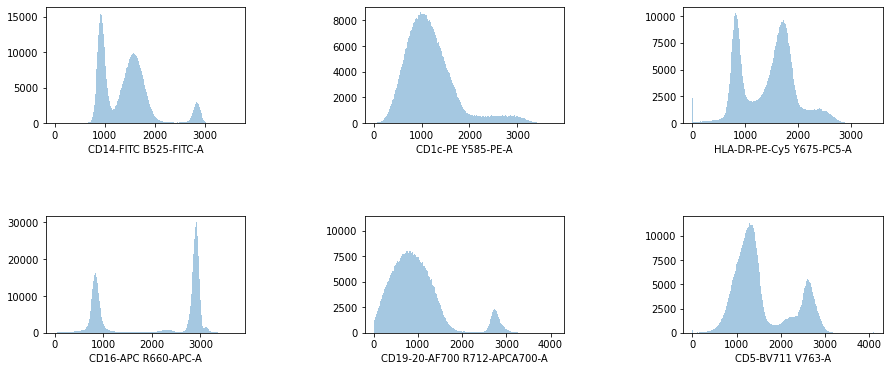

In [105]:
pm.pl.plotdata(adata,
               # save = '/Users/buettnerm/Documents/Projects/Pytometry/test.pdf')
              )

Read gating information from FlowJo.

In [106]:
gate_df = pd.read_csv(data_path + 'workspace_hofer_gate_MF full.csv', index_col=0)

In [108]:
gate_df.shape

(954538, 14)

Interestingly, the 'Time' covariate in the FlowJo sample was divided by 50,000. 

In [109]:
adata.obs['Time']/50000

0           0.000000
1           0.000220
2           0.000880
3           0.001360
4           0.001920
             ...    
954533    436.977844
954534    436.983429
954535    436.983826
954536    436.985107
954537    436.985199
Name: Time, Length: 954538, dtype: float32

In [110]:
adata.obs['Time'] = adata.obs['Time']/50000

Do the Time features match in both tables?

In [111]:
counts = list()
for idx in range(adata.n_obs):
    counts.append( np.diff([adata.obs['Time'][idx], gate_df['Time'].loc[idx+1]]))

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

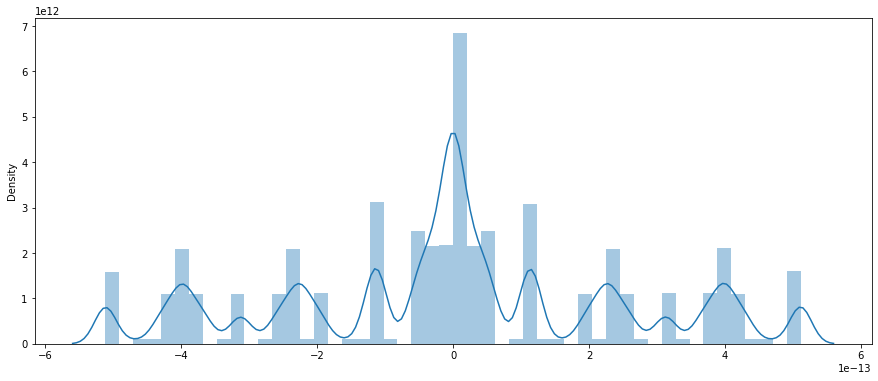

In [112]:
sb.distplot(counts)

That result is not really representing what I had in mind when I wanted to use the "Time" column as index for merging the two data frames, but it is close enough to rest assured that I actually matched the right cells. 

In [115]:
for col in gate_df.columns[1:]:
    adata.obs['gate_' + col] = gate_df.loc[:,gate_df.columns==col].values.flatten()

In [117]:
adatas.append(adata)

### Concatenate data and visualize distributions.

In [118]:
adata = ann.AnnData.concatenate(*adatas, join = 'outer', uns_merge = 'unique')

/home/buettnerm/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [119]:
adata

AnnData object with n_obs × n_vars = 2864709 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time', 'gate_root', 'gate_LymphoMono', 'gate_non B-cells', 'gate_singlets', 'gate_non HLA-DR', 'gate_CD1c+', 'gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+', 'gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+', 'gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-', 'gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-', 'gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono', 'batch'
    var: 'channel', 'marker', 'signal_type'
    uns: 'meta'
    layers: 'original', 'compensated'

In [120]:
del adatas

Let us have the first look at the data.

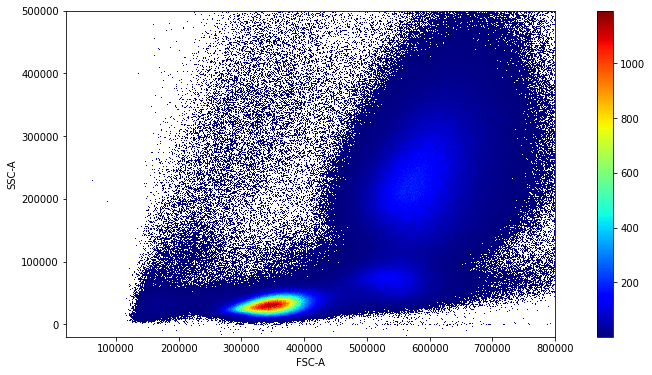

In [121]:
pm.pl.scatter_density(adata, x_lim=[20000.0, 800000.0], y_lim=[-20000.0, 500000.0])

... storing 'sample' as categorical


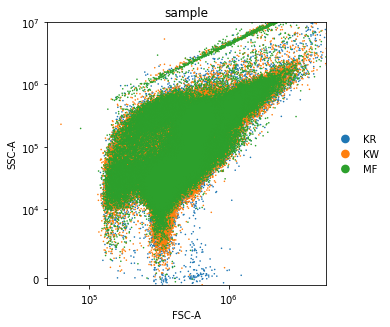

In [122]:
rcParams['figure.figsize']=(5,5)

ax = sc.pl.scatter(adata,  'FSC-A','SSC-A', size=10, color= 'sample',show=False)
plt.xscale('symlog', linthresh=1e4)
plt.yscale('symlog', linthresh=1e4)
plt.xlim(5e4, 5e6)
plt.ylim(-1e3, 1e7)
plt.show()

Restrict the data to the Mono Lympho gate. In this gate, we have less debris. Note: All cells in this gate are also singlets.

In [123]:
adata = adata[adata.obs['gate_LymphoMono']==1]

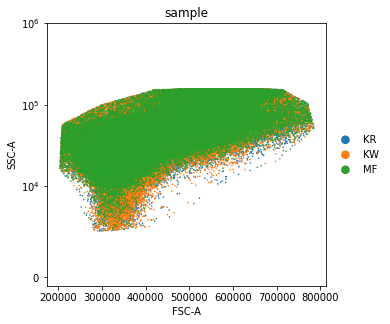

In [125]:
rcParams['figure.figsize']=(5,5)

ax = sc.pl.scatter(adata,  'FSC-A','SSC-A', size=10, color= 'sample',show=False)
#plt.xscale('symlog', linthresh=1e4)
plt.yscale('symlog', linthresh=1e4)
#plt.xlim(-1e3, 1e6)
plt.ylim(-1e3, 1e6)
plt.show()

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


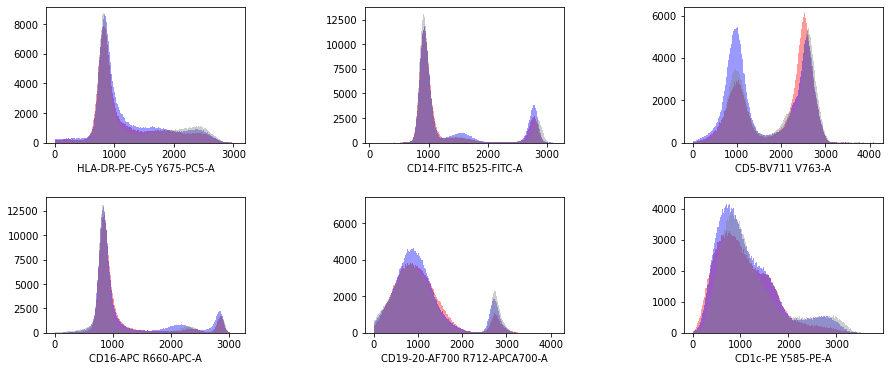

In [126]:
rcParams['figure.figsize']=(15,6)
fig_ind=np.arange(231, 237)
names =['HLA-DR-PE-Cy5 Y675-PC5-A','CD14-FITC B525-FITC-A','CD5-BV711 V763-A',
                                     'CD16-APC R660-APC-A',  'CD19-20-AF700 R712-APCA700-A',
        'CD1c-PE Y585-PE-A']
coloring = ['Red', 'Blue', 'Gray']
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
for index in enumerate(fig_ind):
    ax = fig.add_subplot(index[1])
    for idx in enumerate(adata.obs['batch'].cat.categories):    
        sb.distplot(adata.X[adata.obs['batch']==idx[1],adata.var_names==names[index[0]]], 
                kde=False, norm_hist=False, bins=400, ax=ax, axlabel=names[index[0]],
                color = coloring[idx[0]])
    #plt.grid(True)
plt.show()

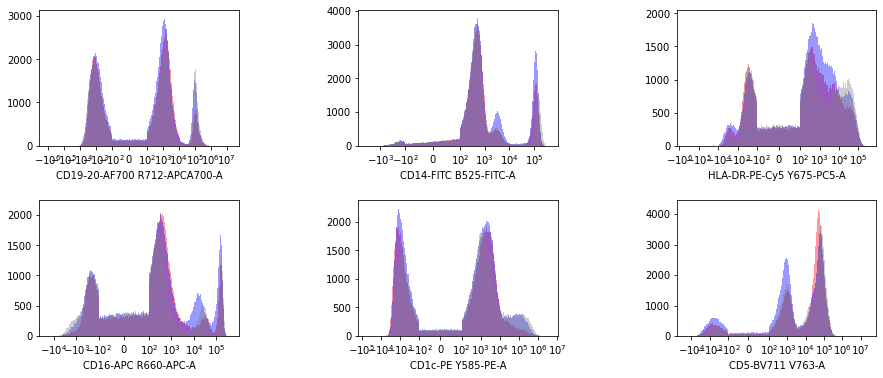

In [127]:
rcParams['figure.figsize']=(15,6)
fig_ind=np.arange(231, 237)
names =[ 'CD19-20-AF700 R712-APCA700-A','CD14-FITC B525-FITC-A','HLA-DR-PE-Cy5 Y675-PC5-A',
        'CD16-APC R660-APC-A',
        'CD1c-PE Y585-PE-A', 'CD5-BV711 V763-A']
coloring = ['Red', 'Blue', 'Gray']
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
for index in enumerate(fig_ind):
    ax = fig.add_subplot(index[1])
    #compute edges
    amin, amax = extrema_np(adata.layers['compensated'][:,
                                                        adata.var_names==names[index[0]]])
    bin_edges = get_bins(amin, amax, 'symlog')
    for idx in enumerate(adata.obs['batch'].cat.categories):   
       
        axs = sb.distplot(adata.layers['compensated'][adata.obs['batch']==idx[1],
                                                             adata.var_names==names[index[0]]], 
                          kde=False,
                          norm_hist=False, 
                          bins=bin_edges, 
                          ax=ax, 
                          axlabel=names[index[0]],
                color = coloring[idx[0]])
        axs.set_xscale('symlog', linthresh=100)
    #plt.grid(True)

#plt.savefig(fname = './figures/histogram_' + today +  '_CD1920pos_per_patient.pdf', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

Plot the forward scatter (height and area) data as scatter plot.

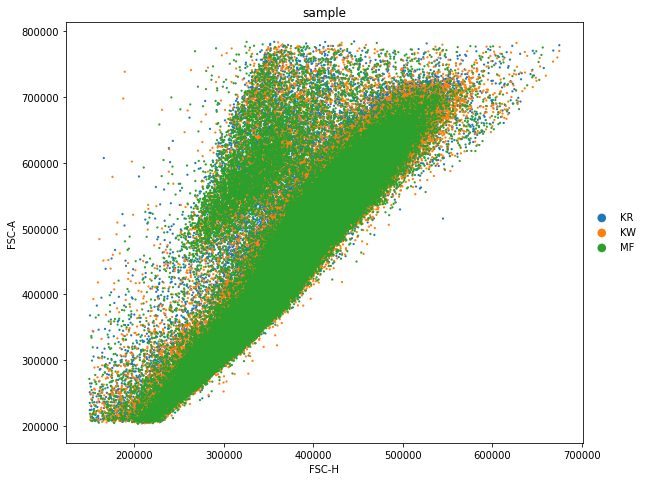

In [128]:
rcParams['figure.figsize']=(8,8)
sc.pl.scatter(adata, 'FSC-H', 'FSC-A', color='sample',size=20)

## Encode gates as cell populations

We aim to classify all cells into the different populations directly, i.e. we aim to annotate two different levels: 
* First level: not annotated, B cells, monocytes, dendritic cells 
* Second level: not annotated, B cells, classical/intermediate/non-classical monocytes, dendritic cell subtypes

We cannot annotate NK cells or T cells due to the lack of markers. Of note, there is a CD16 high population that may be NK cells. 

We observe an overlap of mutually exclusive gates in some cases, mostly we observe the overlap in the monocyte and dendritic cell panel. As dendritic cells are rare, we want to keep them, thus do not exclude any cells, but check how many are in overlapping gates.

In [131]:
overlap_df = pd.crosstab(adata.obs['gate_non B-cells'], 
            [adata.obs['gate_non HLA-DR'], 
             adata.obs['gate_class. Mono'],
             adata.obs['gate_intermed. Mono'],
             adata.obs['gate_non-class. Mono'],
             adata.obs['gate_CD1c+']
            ]).unstack().fillna(0).reset_index()

Define cell type from gating information:

- B cell: `gate_non B-cells == 0`
- monocytes: `sum('gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono')>0`
- dendritic cells: `gate_CD1c+==1`

In [133]:
np.sum(adata.obs['gate_non B-cells']==0)

141674

In [134]:
np.sum(adata.obs[['gate_class. Mono',  
                  'gate_intermed. Mono', 
                  'gate_non-class. Mono']])

gate_class. Mono        228219
gate_intermed. Mono       6841
gate_non-class. Mono     10596
dtype: int64

In [135]:
pd.crosstab(adata.obs['sample'], 
            [
             adata.obs['gate_class. Mono'],
             adata.obs['gate_intermed. Mono'],
             adata.obs['gate_non-class. Mono'],
             adata.obs['gate_CD1c+']
            ])#.unstack().fillna(0).reset_index()

gate_class. Mono           0                                  1               
gate_intermed. Mono        0                     1            0           1   
gate_non-class. Mono       0           1         0            0        1  0   
gate_CD1c+                 0     1     0   1     0    1       0     1  0  0  1
sample                                                                        
KR                    380772  2070  2428  16  2183  164   67763  1016  0  0  0
KW                    418927  1803  3908  28  2382  259  101062  1051  0  0  0
MF                    375362  2938  4183  32  1555  287   55648  1667  1  8  3

In [136]:
adata.obs['manual annotation level 1'] = pd.Categorical(np.repeat('not annotated', adata.n_obs), 
                                        categories=[ 'B cell', 
                                                    'monocyte', 'dendritic cell','not annotated'])

/tmp/ipykernel_3202318/3292226761.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['manual annotation level 1'] = pd.Categorical(np.repeat('not annotated', adata.n_obs),


In [137]:
b_cell_idx = adata.obs['gate_non B-cells']==0
monocyte_idx = np.sum(adata.obs[['gate_class. Mono', 
                                 'gate_intermed. Mono',
                                 'gate_non-class. Mono'
                                ]], axis=1)>0
dc_idx = adata.obs['gate_CD1c+']==1

adata.obs['manual annotation level 1'][b_cell_idx] = 'B cell'
adata.obs['manual annotation level 1'][monocyte_idx] = 'monocyte'
adata.obs['manual annotation level 1'][dc_idx] = 'dendritic cell'

How many cells in overlapping gates do we have? 

In [138]:
pd.crosstab(adata.obs['manual annotation level 1'], 
            [
             adata.obs['gate_class. Mono'],
             adata.obs['gate_non-class. Mono'],
             adata.obs['gate_intermed. Mono']
            ])#.unstack().fillna(0).reset_index()

gate_class. Mono                 0                    1      
gate_non-class. Mono             0            1       0     1
gate_intermed. Mono              0     1      0       0  1  0
manual annotation level 1                                    
B cell                      141674     0      0       0  0  0
monocyte                         0  6120  10519  224473  8  1
dendritic cell                6811   710     76    3734  3  0
not annotated              1033387     0      0       0  0  0

In [139]:
np.sum(np.sum([monocyte_idx, dc_idx], axis=0)>1)

4523

In [140]:
adata.obs['manual annotation level 1'].value_counts()

not annotated     1033387
monocyte           241121
B cell             141674
dendritic cell      11334
Name: manual annotation level 1, dtype: int64

Annotate a second level of cell types:

In [141]:
adata.obs['manual annotation level 2'] = pd.Categorical(np.repeat('not annotated', adata.n_obs), 
                                        categories=['B cell', 
                                                    'classical monocyte', 
                                                    'non-classical monocyte',
                                                    'intermediate monocyte',
                                                    'DC Q1(CD14-, CD5+)',
                                                    'DC Q2(CD14+, CD5+)', 
                                                    'DC Q3(CD14+, CD5-)',
                                                    'DC Q4(CD14-, CD5-)',
                                                    'not annotated'
                                                   ])

Check if the quadrant subtypes of DCs are actually a real subset of the DC gate.

In [142]:
pd.crosstab(adata.obs['gate_CD1c+'], 
            [
             adata.obs['gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+'],
             adata.obs['gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+'],
             adata.obs['gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-'],
             adata.obs['gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-']
            ])#.unstack().fillna(0).reset_index()

gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+        0                   \
gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+        0                1   
gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-        0           1    0   
gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-        0     1     0    0   
gate_CD1c+                                                                      
0                                                    1416182     0     0    0   
1                                                          0  1773  7639  269   

gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+     1  
gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+     0  
gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-     0  
gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-     0  
gate_CD1c+                                                 
0                                                       0  
1                                                    1653

Annotate monocytes first, then dendritic cells to overwrite the monocyte annotation.

In [143]:
cmonocyte_idx = adata.obs['gate_class. Mono']==1
imonocyte_idx = adata.obs['gate_intermed. Mono']==1
nmonocyte_idx = adata.obs['gate_non-class. Mono']==1

dc1 = adata.obs['gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+'] == 1
dc2 = adata.obs['gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+'] == 1
dc3 = adata.obs['gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-'] == 1
dc4 = adata.obs['gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-'] == 1

adata.obs['manual annotation level 2'][b_cell_idx] = 'B cell'
adata.obs['manual annotation level 2'][cmonocyte_idx] = 'classical monocyte'
adata.obs['manual annotation level 2'][nmonocyte_idx] = 'non-classical monocyte'
adata.obs['manual annotation level 2'][imonocyte_idx] = 'intermediate monocyte'
adata.obs['manual annotation level 2'][dc1] = 'DC Q1(CD14-, CD5+)'
adata.obs['manual annotation level 2'][dc2] = 'DC Q2(CD14+, CD5+)'
adata.obs['manual annotation level 2'][dc3] = 'DC Q3(CD14+, CD5-)'
adata.obs['manual annotation level 2'][dc4] = 'DC Q4(CD14-, CD5-)'



In [144]:
adata.obs['manual annotation level 2'].value_counts()

not annotated             1033387
classical monocyte         224473
B cell                     141674
non-classical monocyte      10520
DC Q3(CD14+, CD5-)           7639
intermediate monocyte        6128
DC Q4(CD14-, CD5-)           1773
DC Q1(CD14-, CD5+)           1653
DC Q2(CD14+, CD5+)            269
Name: manual annotation level 2, dtype: int64

In [145]:
pd.crosstab(adata.obs['sample'],adata.obs['manual annotation level 2'])

manual annotation level 2,B cell,classical monocyte,non-classical monocyte,intermediate monocyte,"DC Q1(CD14-, CD5+)","DC Q2(CD14+, CD5+)","DC Q3(CD14+, CD5-)","DC Q4(CD14-, CD5-)",not annotated
sample,,,,,,,,,
KR,29960,67763,2428,2183,478,39,2071,678,350812
KW,53721,101062,3908,2382,274,102,2455,310,365206
MF,57993,55648,4184,1563,901,128,3113,785,317369


Save to file.

In [146]:
adata.write('./../data/Hofer_IMA/mono_merge_gates.h5ad')

# Analysis full dataset

In [150]:
adata = sc.read('./../data/Hofer_IMA/mono_merge_gates.h5ad')

Visualize as histogram.

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


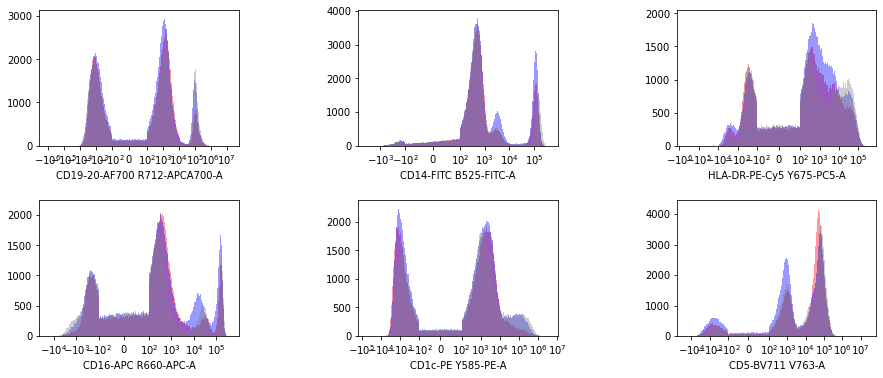

In [147]:
rcParams['figure.figsize']=(15,6)
fig_ind=np.arange(231, 237)
names =[ 'CD19-20-AF700 R712-APCA700-A','CD14-FITC B525-FITC-A','HLA-DR-PE-Cy5 Y675-PC5-A',
        'CD16-APC R660-APC-A',
        'CD1c-PE Y585-PE-A', 'CD5-BV711 V763-A']
coloring = ['Red', 'Blue', 'Gray']
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
for index in enumerate(fig_ind):
    ax = fig.add_subplot(index[1])
    #compute edges for the histogram 
    amin, amax = extrema_np(adata.layers['compensated'][:,
                                                        adata.var_names==names[index[0]]])
    bin_edges = get_bins(amin, amax, 'symlog')
    
    for idx in enumerate(adata.obs['batch'].cat.categories):   
       
        axs = sb.distplot(adata.layers['compensated'][adata.obs['batch']==idx[1],
                                                           adata.var_names==names[index[0]]], 
                          kde=False,
                          norm_hist=False, 
                          bins=bin_edges, 
                          ax=ax, 
                          axlabel=names[index[0]],
                color = coloring[idx[0]])
        axs.set_xscale('symlog', linthresh=100)
    #plt.grid(True)

#plt.savefig(fname = './figures/histogram_' + today +  '_CD1920pos_per_patient.pdf', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

## Compute neighbourhood graph and embedding

In [148]:
sc.pp.neighbors(adata, n_neighbors=15)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:06:21)


In [149]:
sc.tl.leiden(adata, resolution=1)

running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (2:27:36)


In [150]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (1:05:47)


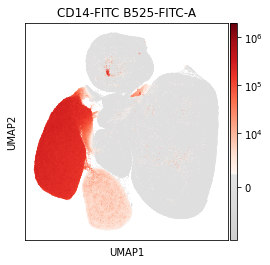

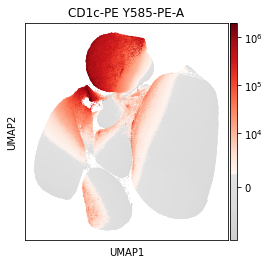

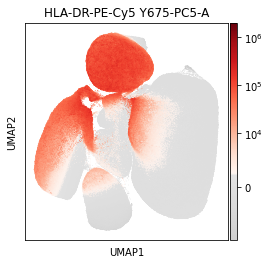

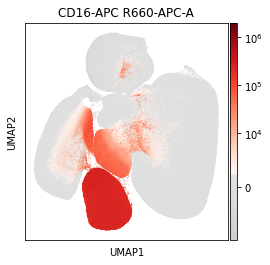

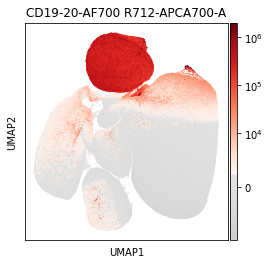

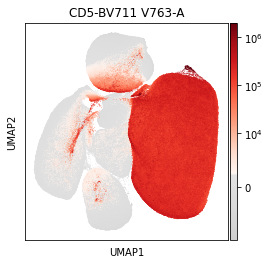

In [151]:
rcParams['figure.figsize']=(4,4)
for name in adata.var_names:
    sc.pl.umap(adata, color=name,color_map=mymap,
               layer='compensated',
               norm=colors.SymLogNorm(linthresh=1e4, 
                                      vmin=-1e4,#adata.layers['compensated'].min(), 
                                      vmax=2e6), 
               size=2, 
               save='_'+today +'_' +name +'.png'
              )

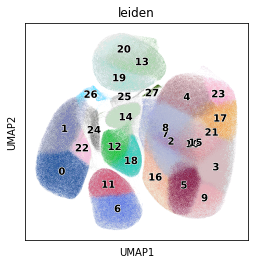

In [152]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color='leiden',  
           legend_loc='on data',
           legend_fontoutline=1,
           save='_' +today +'_leiden_fulldata.png'
          )

Set colors.

In [153]:
adata.uns['manual annotation level 1_colors'] = list()
adata.uns['manual annotation level 1_colors'].append('#1f77b4') #B cell
adata.uns['manual annotation level 1_colors'].append('#ff8adc') # monocytes
adata.uns['manual annotation level 1_colors'].append('#0f992d') # DC
adata.uns['manual annotation level 1_colors'].append('#bbbbbb') #not annotated

In [154]:
adata.uns['manual annotation level 2_colors'] = list()
adata.uns['manual annotation level 2_colors'].append('#1f77b4') #B cell
adata.uns['manual annotation level 2_colors'].append('#ff8adc') # class monocytes
adata.uns['manual annotation level 2_colors'].append('#9bb011') # non-class monocytes
adata.uns['manual annotation level 2_colors'].append('#57cdff') # intermediate monocytes
adata.uns['manual annotation level 2_colors'].append('#0f992d') # DC Q1
adata.uns['manual annotation level 2_colors'].append('#fcba03') # DC Q2
adata.uns['manual annotation level 2_colors'].append('#327855') # DC Q3
adata.uns['manual annotation level 2_colors'].append('#d4c357') # DC Q4
adata.uns['manual annotation level 2_colors'].append('#bbbbbb') #not annotated

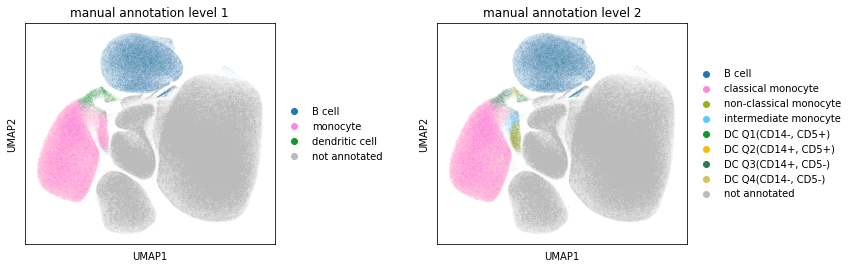

In [155]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color=['manual annotation level 1', 'manual annotation level 2'], 
           wspace=0.5, 
           save='_' +today +'_manual_annotation.png'
          )

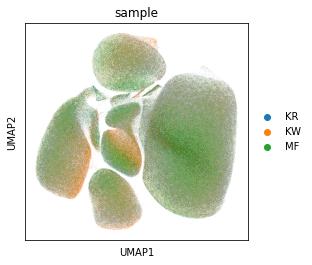

In [156]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color='sample', 
           save='_' +today +'_patient.png'
          )

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


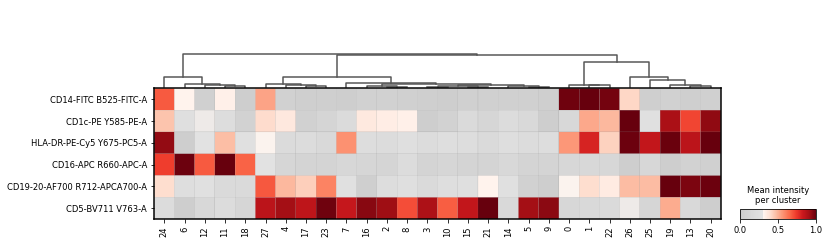

In [157]:
sc.pl.matrixplot(adata, var_names=adata.var_names, swap_axes=True, 
                 dendrogram=True, use_raw=False,
                 groupby='leiden', cmap=mymap, standard_scale='var',
                 colorbar_title = 'Mean intensity\nper cluster',
                 save= '_' + today + '_leiden_fulldata_scaled.png'
                )

## Determine mean fluorescence level and threshold clusters

In [158]:
df = pd.DataFrame(data = adata.layers['compensated'], 
                  index = adata.obs_names, 
                  columns=adata.var_names)


In [159]:
df['leiden']= pd.Series(adata.obs['leiden'], index=df.index)
df['leiden']= df['leiden'].cat.remove_unused_categories()

In [160]:
df_all = pd.DataFrame(pd.value_counts(adata.obs['leiden']).values,
                      index=pd.value_counts(adata.obs['leiden']).index,
                      columns=['leiden_size'])

In [163]:
df_all['mean_CD14']=df.groupby(by='leiden')['CD14-FITC B525-FITC-A'].apply(np.median).values
df_all['mean_CD16']=df.groupby(by='leiden')['CD16-APC R660-APC-A'].apply(np.median).values
df_all['mean_CD1c']=df.groupby(by='leiden')['CD1c-PE Y585-PE-A'].apply(np.median).values
df_all['mean_CD19-20']=df.groupby(by='leiden')['CD19-20-AF700 R712-APCA700-A'].apply(np.median).values
df_all['mean_HLA-DR']=df.groupby(by='leiden')['HLA-DR-PE-Cy5 Y675-PC5-A'].apply(np.median).values
df_all['mean_CD5']=df.groupby(by='leiden')['CD5-BV711 V763-A'].apply(np.median).values

df_all['CD14_lowhigh'] = pd.cut(df_all['mean_CD14'], bins=[-1e6, 1e4, 1e8], labels=['low', 'high'])
df_all['CD16_lowhigh'] = pd.cut(df_all['mean_CD16'], bins=[-1e6, 2e4,1e5, 1e8], labels=['low', 'high', 'highest'])
df_all['CD1920_lowhigh'] = pd.cut(df_all['mean_CD19-20'], bins=[-1e6, 5e4, 1e8], labels=['low', 'high'])
df_all['HLA-DR_lowhigh'] = pd.cut(df_all['mean_HLA-DR'], bins=[-1e6, 1.2e4, 1e8], labels=['low', 'high'])
df_all['CD1c_lowhigh'] = pd.cut(df_all['mean_CD1c'], bins=[-1e6, 1e5, 1e8], labels=['low', 'high'])
df_all['CD5_lowhigh'] = pd.cut(df_all['mean_CD5'], bins=[-1e6, 5e3, 1e8], labels=['low', 'high'])

In [164]:
df_all

,leiden_size,mean_CD14,mean_CD16,mean_CD1c,mean_CD19-20,mean_HLA-DR,mean_CD5,CD14_lowhigh,CD16_lowhigh,CD1920_lowhigh,HLA-DR_lowhigh,CD1c_lowhigh,CD5_lowhigh
0,105970,117515.625000,165.981323,3.913851,650.739929,3381.261475,471.713623,high,low,low,low,low,low
1,95573,130013.203125,307.570160,4722.250488,1600.906128,10515.543945,618.641235,high,low,low,low,low,low
2,89008,541.296143,162.960510,1523.379883,-167.135132,0.058232,66497.328125,low,low,low,low,low,high
3,85814,355.423279,11.016414,-1109.497314,-554.918518,26.008888,57959.781250,low,low,low,low,low,high
4,76258,551.097778,212.451385,1787.702637,2626.660156,-102.492218,65450.792969,low,low,low,low,low,high
5,75476,381.213745,62.906754,7.268638,-1622.837891,60.870041,65421.343750,low,low,low,low,low,high
6,71099,2968.001953,146606.312500,708.097961,-5.724454,-1311.806885,-289.131744,low,highest,low,low,low,low
7,60783,284.703369,223.108582,157.860657,24.092319,2809.319824,40303.984375,low,low,low,low,low,high
8,56213,418.984985,416.452301,1575.807373,145.011520,280.168274,18687.896484,low,low,low,low,low,high
9,54942,363.705139,17.543255,-1057.524414,-2233.591064,94.096970,79664.257812,low,low,low,low,low,high


Let us annotate the cells to the best of our knowledge.

|marker combination| cell type|
|-|-|
|CD19/20 - high | B cells|
|CD19/20 - low | non - B cells|
|CD19/20 low + HLA-DR low + CD5 high | T cells |
|CD19/20 low + HLA-DR low + CD16 high | NK cells |
|CD19/20 low + HLA-DR high + CD14 low + CD16 low | T cells |
|CD19/20 low + CD14 high + CD1c low | monocytes |
|CD19/20 low + HLA-DR high + CD14 low + CD1c high | P3 (dendritic cells)|

Notably, we are not sure about the T cell and NK cell annotation, and we therefore assign the "not annotated" label for these cells.

Monocyte classification (refine clustering):

|marker combination| cell type|
|-|-|
| CD14 high + CD16 low | classical |
| CD14 high + CD16 high | intermediate |
| CD14 low + CD16 high | non-classical |
|CD19/20 low + HLA-DR high + CD14 high + CD1c high | P1/2 (dendritic cells)|

In [165]:
df_all['B_cells'] = 'non B cell'
df_all['B_cells'].iloc[np.logical_and(df_all['CD1920_lowhigh']=='high',
                                      df_all['CD16_lowhigh']=='low'
                                     )] = 'B cell'


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [166]:
df_all['dendritic_cells'] = pd.Series(np.zeros(df_all.shape[0]))
df_all['dendritic_cells'].iloc[np.logical_and(np.logical_and(np.logical_and(df_all['CD1920_lowhigh']=='low', 
                                         df_all['HLA-DR_lowhigh']=='high'), 
                                        df_all['CD1c_lowhigh']=='high'), 
                                         df_all['CD14_lowhigh']=='low'
                                        )] = 'dendritic cell'

In [167]:
df_all['lymphocytes'] = pd.Series(np.zeros(df_all.shape[0]))
df_all['lymphocytes'].iloc[np.logical_and(np.logical_and(np.logical_and(df_all['CD1920_lowhigh']=='low', 
                                                df_all['HLA-DR_lowhigh']=='low'),
                                df_all['CD14_lowhigh']=='low'),
                                         df_all['CD5_lowhigh'] =='high')] = 'not annotated' #'naive T cells'
df_all['lymphocytes'].iloc[np.logical_and(np.logical_and(df_all['CD1920_lowhigh']=='low', 
                                     df_all['HLA-DR_lowhigh']=='low'), df_all['CD16_lowhigh']=='high')] = 'not annotated' #'NK cells'
df_all['lymphocytes'].iloc[np.logical_and(np.logical_and(np.logical_and(df_all['CD1920_lowhigh']=='low', 
                                     df_all['HLA-DR_lowhigh']=='high'), 
                                     
                                          df_all['CD14_lowhigh']=='low'),
                                          df_all['CD16_lowhigh']=='low')] = 'not annotated' #'T cells'

In [168]:
df_all['monocytes'] = pd.Series(np.zeros(df_all.shape[0]))

df_all['monocytes'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', 
                                   df_all['CD16_lowhigh']=='high')] = 'intermediate'
df_all['monocytes'].iloc[np.logical_and(np.logical_and(df_all['CD14_lowhigh']=='low', 
                                   df_all['CD16_lowhigh']=='high'), 
                                   df_all['HLA-DR_lowhigh']=='high')] = 'non_classical'
df_all['monocytes'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', df_all['CD16_lowhigh']=='low')] = 'classical'
df_all['monocytes'].iloc[np.logical_and(np.logical_and(df_all['CD14_lowhigh']=='high', 
                                   df_all['CD16_lowhigh']=='low'),
                              df_all['CD1c_lowhigh']=='high')] = 'dendritic cells'

In [169]:
pd.crosstab(adata.obs['leiden'][np.in1d(adata.obs['leiden'],
                                        df_all['B_cells'][
                                            np.flatnonzero(df_all['B_cells']=='non B cell')].index)], 
                                                           adata.obs['batch'], margins=True)/adata.n_obs

batch,0,1,2,All
leiden,,,,
0,0.020983,0.038653,0.014598,0.074234
1,0.022057,0.021703,0.023191,0.066951
2,0.021556,0.017624,0.023172,0.062352
3,0.023533,0.019233,0.017348,0.060114
4,0.022157,0.016957,0.014306,0.053420
5,0.015025,0.016048,0.021799,0.052872
6,0.015339,0.025762,0.008705,0.049806
7,0.020573,0.013136,0.008871,0.042580
8,0.016864,0.011020,0.011495,0.039378


We have annotated the cell types roughly based on simple thresholds. Let us rename and summarize the `leiden` clusters to the corresponding cell types.

In [172]:
adata.obs['cell_types']= pd.Categorical(np.repeat('not annotated', adata.n_obs), 
                                        categories= ['B cell', 'monocyte', 'dendritic cell','not annotated'
                                                                            ])
adata.obs['cell_types'][np.in1d(adata.obs['leiden'], 
                                     df_all['B_cells'][df_all['B_cells']=='B cell'].index)] = 'B cell'
adata.obs['cell_types'][np.in1d(adata.obs['leiden'], 
                                     df_all['lymphocytes'][df_all['lymphocytes']=='not annotated'].index)] ='not annotated' # 'T cell'

adata.obs['cell_types'][np.in1d(adata.obs['leiden'], 
                                     df_all['monocytes'][np.in1d(df_all['monocytes'], ['classical', 'intermediate', 
                                                                                       'non_classical'])].index)] = 'monocyte'
adata.obs['cell_types'][np.in1d(adata.obs['leiden'], 
                                     df_all['dendritic_cells'][pd.notnull(df_all['dendritic_cells'])].index)] = 'dendritic cell'
#adata_filt.obs['cell_types'][np.in1d(adata_filt.obs['louvain'], 
#                                     df_all['monocytes'][np.in1d(df_all['monocytes'], ['dendritic cells'])].index)] = 'DC'
adata.obs['cell_types']= adata.obs['cell_types'].cat.remove_unused_categories()

Add color scheme.

In [173]:
adata.obs['cell_types'].cat.categories

Index(['B cell', 'monocyte', 'dendritic cell', 'not annotated'], dtype='object')

In [174]:
adata.uns['cell_types_colors'] = list()

adata.uns['cell_types_colors'].append('#1f77b4') # B cell
adata.uns['cell_types_colors'].append('#ff8adc') # monocytes
adata.uns['cell_types_colors'].append('#1c8017') # DC
adata.uns['cell_types_colors'].append('#bbbbbb') # not annotated

In [175]:
pd.value_counts(adata.obs['cell_types'])

not annotated     1034722
monocyte           246478
B cell             138242
dendritic cell       8074
Name: cell_types, dtype: int64

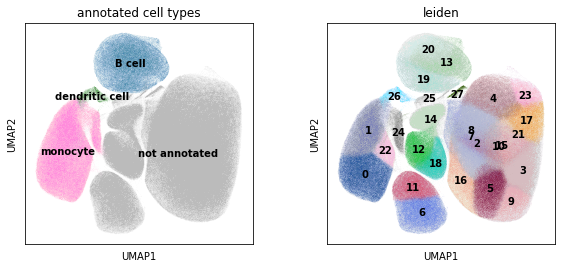

In [176]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color=['cell_types', 'leiden'], #save=today+ '_rough_cell_types.png',
           title=['annotated cell types', 'leiden'],
           legend_loc='on data')

In [177]:
pd.crosstab(adata.obs['cell_types'], adata.obs['batch'])

batch,0,1,2
cell_types,,,
B cell,28701,52658,56883
monocyte,73658,109290,63530
dendritic cell,2417,2223,3434
not annotated,351636,365249,317837


In [178]:
pd.crosstab(adata.obs['cell_types'], adata.obs['manual annotation level 1'])

manual annotation level 1,B cell,monocyte,dendritic cell,not annotated
cell_types,,,,
B cell,138096,0,57,89
monocyte,35,240298,3581,2564
dendritic cell,2,4,7624,444
not annotated,3541,819,72,1030290


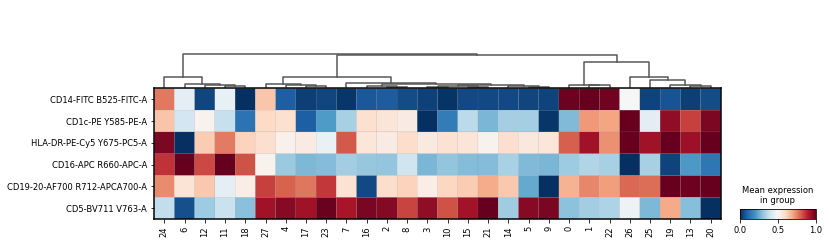

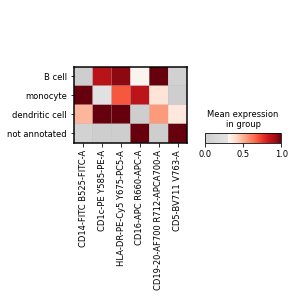

In [179]:
sc.pl.matrixplot(adata, groupby='leiden', dendrogram=True, swap_axes=True, standard_scale='var',
                 var_names=adata.var_names, cmap='RdBu_r', use_raw=False, log='True', 
                # save='_' + today+'_louvain_norm.pdf'
                ) 

sc.pl.matrixplot(adata, groupby='cell_types', dendrogram=False, standard_scale='var',
                 var_names=adata.var_names, cmap=mymap, use_raw=False, log='True', 
                 save='_' + today+'_cell_type_lvl1_scaled.pdf'
                )

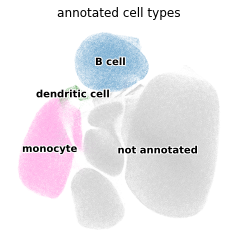

In [180]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color='cell_types', 
           save=today+ '_first-level_cell_types.png',
           title='annotated cell types',
           frameon=False,
           legend_fontoutline=2,
           legend_loc='on data')

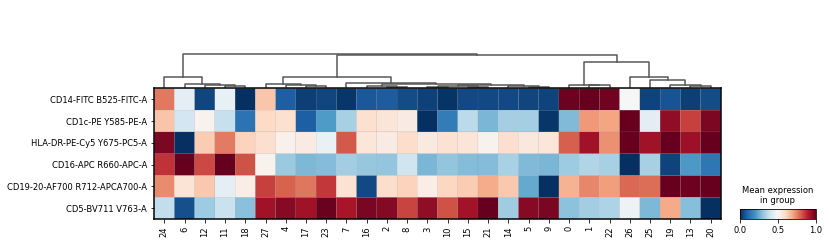

In [181]:
sc.pl.matrixplot(adata, groupby='leiden',
                 dendrogram=True, swap_axes=True, standard_scale='var',
                 var_names=adata.var_names, cmap='RdBu_r', use_raw=False, log='True', 
                # save='_' + today+'_louvain_norm.pdf'
                ) 

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cell_types']`


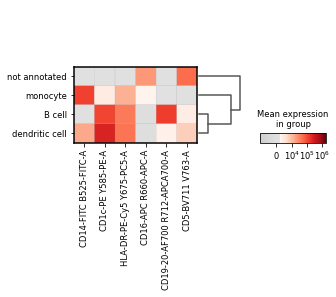

In [183]:
sc.pl.matrixplot(adata, adata.var_names, groupby='cell_types', cmap=mymap, 
                 layer='compensated',
                 #swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=2e6),
                 dendrogram=True, #save='_' + today+'_louvain.pdf'
                )

We tend to overestimate the number of monocytes with the simple thresholding approach, but we will lose too many non-classical monocytes otherwise. We will clean this up in the next step. 

## Subcluster monocytes and dendritic cells

In order to refine the monocytes and distinguish dendritic cells, let us subcluster the monocyte population.

In [352]:
adata_mono = adata[adata.obs['cell_types'].isin(['monocyte', 'dendritic cell'])].copy()

Recompute embedding.

In [353]:
sc.pp.neighbors(adata_mono)
sc.tl.umap(adata_mono)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:49)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:05:40)


In [367]:
sc.tl.leiden(adata_mono, key_added='leiden_mono', resolution=1.5)

running Leiden clustering
    finished: found 30 clusters and added
    'leiden_mono', the cluster labels (adata.obs, categorical) (0:07:43)


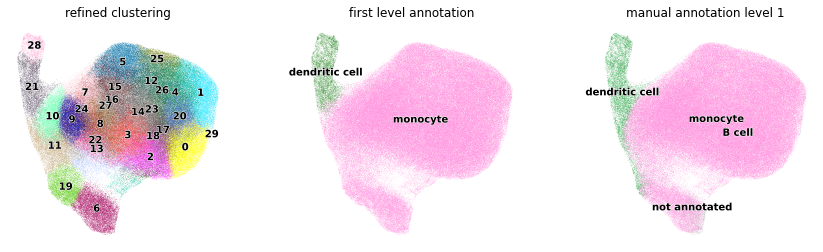

In [368]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_mono, color=['leiden_mono', 'cell_types', 'manual annotation level 1'],
           title=['refined clustering', 'first level annotation'],
           frameon=False,
           legend_loc='on data',  #
           save=today+ '_overview_monoDC.png',
           legend_fontoutline=1)

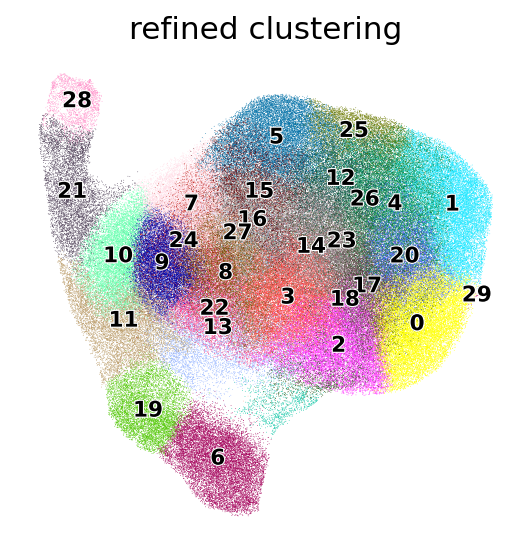

In [58]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_mono, color=['leiden_mono'],
           title=['refined clustering'],
           frameon=False,
           legend_loc='on data',  #
           legend_fontsize='x-small',
           save=today+ '_leiden_monoDC.pdf',
           legend_fontoutline=1)

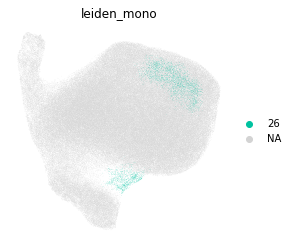

In [376]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_mono, color=['leiden_mono'],
           groups=['26'],
           frameon=False,
          # legend_loc='on data',  #
    
           legend_fontoutline=1)

Refine clustering to split cluster 26.

In [372]:
sc.tl.leiden(adata_mono, restrict_to=['leiden_mono',['26']], key_added='leiden_mono_R', resolution=0.5)

running Leiden clustering
    finished: found 39 clusters and added
    'leiden_mono_R', the cluster labels (adata.obs, categorical) (0:00:00)


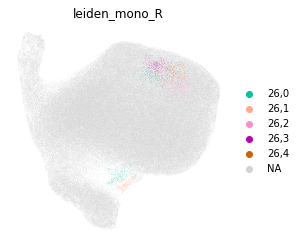

In [377]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_mono, color=['leiden_mono_R'],
           groups=['26,0','26,1','26,2','26,3', '26,4', ],
           frameon=False,
          # legend_loc='on data',  #
    
           legend_fontoutline=1)

In [374]:
sc.tl.dendrogram(adata_mono, 'leiden_mono_R')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden_mono_R']`


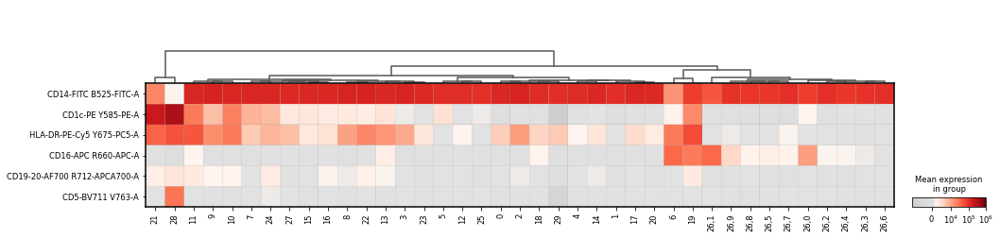

In [375]:
sc.pl.matrixplot(adata_mono, adata.var_names, groupby='leiden_mono_R', 
                 cmap=mymap, layer='compensated', 
                 swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=1e6),
                 dendrogram=True, 
                 #save='_' + today+'_leiden_monoDC.png'
                )

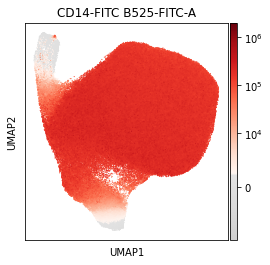

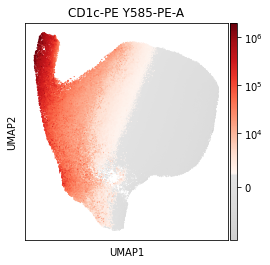

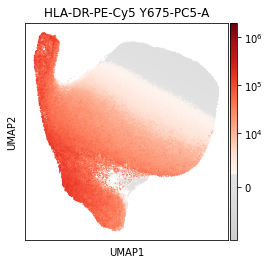

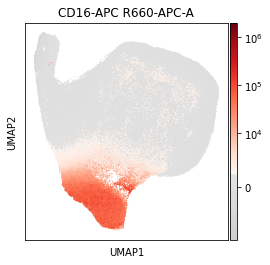

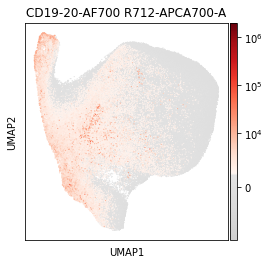

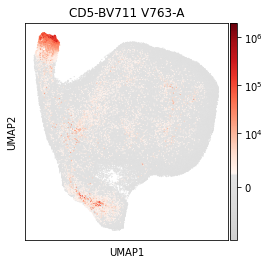

In [189]:
rcParams['figure.figsize']=(4,4)
for name in adata.var_names:
    sc.pl.umap(adata_mono, color=name,color_map=mymap,
               layer='compensated',
               norm=colors.SymLogNorm(linthresh=1e4, 
                                      vmin=-1e4, vmax=2e6), 
               size=5, 
               save='_'+today +'_' +name +'_monoDC.png'
              )

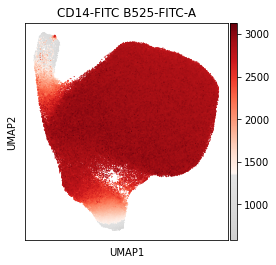

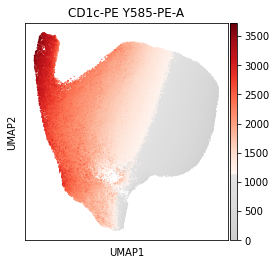

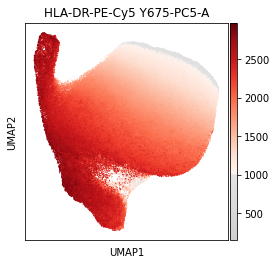

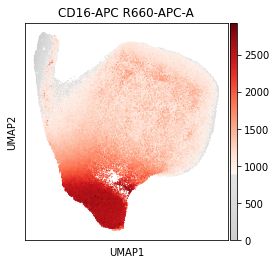

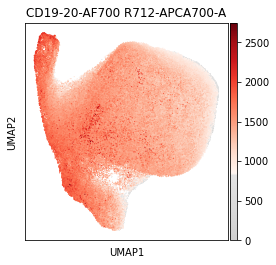

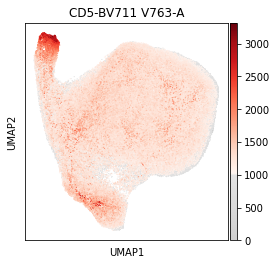

In [190]:
rcParams['figure.figsize']=(4,4)
for name in adata.var_names:
    sc.pl.umap(adata_mono, color=name,color_map=mymap,
               size=5, 
               #save='_'+today +'_' +name +'.png'
              )

In [396]:
sc.tl.dendrogram(adata_mono, 'leiden_mono')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden_mono']`


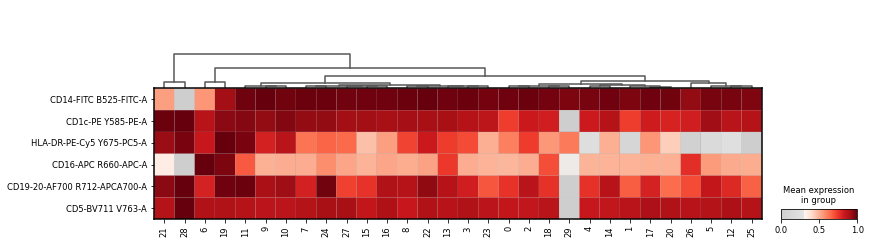

In [397]:
sc.pl.matrixplot(adata_mono, groupby='leiden_mono', 
                 dendrogram=True, swap_axes=True, standard_scale='var',
                 var_names=adata_mono.var_names, cmap=mymap, use_raw=False, log='True', 
                 save='_' + today+'_leiden_monoDC_scaled.png'
                ) 

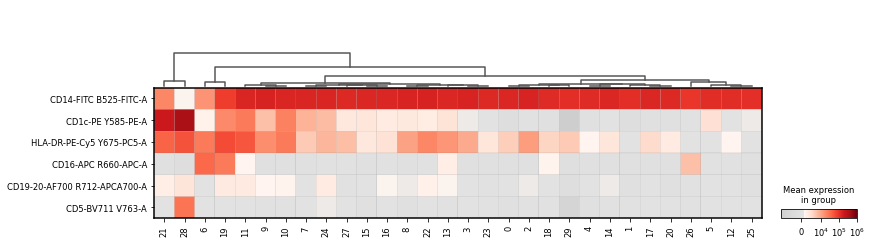

In [398]:
sc.pl.matrixplot(adata_mono, adata.var_names, groupby='leiden_mono', 
                 cmap=mymap, layer='compensated', 
                 swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=1e6),
                 dendrogram=True, 
                 save='_' + today+'_leiden_monoDC.png'
                )

In [513]:
df = pd.DataFrame(data = adata_mono.layers['compensated'], 
                  index = adata_mono.obs_names, 
                  columns=adata_mono.var_names)


In [514]:
df['leiden']= pd.Series(adata_mono.obs['leiden_mono'], index=df.index)
df['leiden']= df['leiden'].cat.remove_unused_categories()

In [515]:
df_all = pd.DataFrame(pd.value_counts(adata_mono.obs['leiden_mono']).values,
                      index=pd.value_counts(adata_mono.obs['leiden_mono']).index,
                      columns=['leiden_mono_size'])

In [521]:
df_all['mean_CD14']=df.groupby(by='leiden')['CD14-FITC B525-FITC-A'].apply(np.median).values
df_all['mean_CD16']=df.groupby(by='leiden')['CD16-APC R660-APC-A'].apply(np.mean).values
df_all['mean_CD1c']=df.groupby(by='leiden')['CD1c-PE Y585-PE-A'].apply(np.median).values
df_all['mean_CD19-20']=df.groupby(by='leiden')['CD19-20-AF700 R712-APCA700-A'].apply(np.median).values
df_all['mean_HLA-DR']=df.groupby(by='leiden')['HLA-DR-PE-Cy5 Y675-PC5-A'].apply(np.median).values
df_all['mean_CD5']=df.groupby(by='leiden')['CD5-BV711 V763-A'].apply(np.median).values

df_all['CD14_lowhigh'] = pd.cut(df_all['mean_CD14'], bins=[-1e6,1e3, 6e4, 1e7], labels=['lowest','low', 'high'])
df_all['CD16_lowhigh'] = pd.cut(df_all['mean_CD16'], bins=[-1e6, 2e4,6e4, 1e7], labels=['low', 'high', 'highest'])
df_all['CD1920_lowhigh'] = pd.cut(df_all['mean_CD19-20'], bins=[-1e6, 1e5, 1e7], labels=['low', 'high'])
df_all['HLA-DR_lowhigh'] = pd.cut(df_all['mean_HLA-DR'], bins=[-1e6, 4e3, 1e7], labels=['low', 'high'])
df_all['CD1c_lowhigh'] = pd.cut(df_all['mean_CD1c'], bins=[-1e6, 1.4e4, 1e7], labels=['low', 'high'])
df_all['CD5_lowhigh'] = pd.cut(df_all['mean_CD5'], bins=[-1e6, 5e3, 1e7], labels=['low', 'high'])

In [523]:
df_all['dendritic_cells'] = pd.Series(np.zeros(df_all.shape[0]))
df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh'].isin(['low', 'lowest']),
    np.logical_and(np.logical_and(df_all['CD1920_lowhigh']=='low', 
                                         df_all['HLA-DR_lowhigh']=='high'), 
                                        df_all['CD1c_lowhigh']=='high'))] = 'dendritic cell' #P3


/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [524]:
df_all['monocytes'] = pd.Series(np.repeat('not annotated', df_all.shape[0]))

df_all['monocytes'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', 
                                   df_all['CD16_lowhigh']=='high')] = 'intermediate'
df_all['monocytes'].iloc[np.logical_and(np.logical_and(df_all['CD14_lowhigh']=='low', 
                                   df_all['CD16_lowhigh']=='high'), 
                                   df_all['HLA-DR_lowhigh']=='high')] = 'non_classical'
df_all['monocytes'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', 
                                        df_all['CD16_lowhigh']=='low')] = 'classical'
df_all['monocytes'].iloc[np.logical_and(np.logical_and(df_all['CD14_lowhigh']=='high', 
                                   df_all['CD16_lowhigh']=='low'),
                              df_all['CD1c_lowhigh']=='high')] = 'dendritic cells'

We have annotated the monocytes roughly based on simple thresholds. Let us rename and summarize the `leiden` clusters to the corresponding cell types.

In [534]:
adata_mono.obs['cell_types2']= pd.Categorical(np.repeat('not annotated', adata_mono.n_obs), 
                                              categories =['classical monocyte', 'non-classical monocyte', 
                                                           'intermediate monocyte', 
                                                           'dendritic cell','not annotated', 
                                                          # 'myeloid-derived suppressor cell'
                                                           
                                                          ])


adata_mono.obs['cell_types2'][np.in1d(adata_mono.obs['leiden_mono'], 
                                     df_all['monocytes'][df_all['monocytes']=='classical'].index)] = 'classical monocyte'
adata_mono.obs['cell_types2'][np.in1d(adata_mono.obs['leiden_mono'], 
                                     df_all['monocytes'][np.in1d(df_all['monocytes'], ['intermediate'])].index)] = 'intermediate monocyte'
adata_mono.obs['cell_types2'][np.in1d(adata_mono.obs['leiden_mono'], 
                                     df_all['monocytes'][np.in1d(df_all['monocytes'], ['non_classical'])].index)] = 'non-classical monocyte'
adata_mono.obs['cell_types2'][np.in1d(adata_mono.obs['leiden_mono'], 
                                     df_all['monocytes'][df_all['monocytes']=='dendritic cells'].index)] = 'dendritic cell'
adata_mono.obs['cell_types2'][np.in1d(adata_mono.obs['leiden_mono'], 
                                     df_all['dendritic_cells'][pd.notnull(df_all['dendritic_cells'])].index)] = 'dendritic cell'
#adata_mono.obs['cell_types2'][adata_mono.obs['leiden_mono']=='26'] = 'myeloid-derived suppressor cell'
adata_mono.obs['cell_types2']= adata_mono.obs['cell_types2'].cat.remove_unused_categories()

In [49]:
adata_mono.obs['cell_types2']= adata_mono.obs['cell_types2'].cat.remove_unused_categories()

In [50]:
pd.crosstab(adata_mono.obs['cell_types2'], adata_mono.obs['sample'])

sample,KR,KW,MF
cell_types2,,,
classical monocyte,62633,97148,48866
non-classical monocyte,2742,4954,4613
intermediate monocyte,2586,2355,1951
dendritic cell,8114,7056,11534


In [51]:
adata_mono.uns['cell_types2_colors'] = list()
adata_mono.uns['cell_types2_colors'].append('#ff8adc') # class monocytes
adata_mono.uns['cell_types2_colors'].append('#9bb011') # non-class monocytes
adata_mono.uns['cell_types2_colors'].append('#57cdff') # intermediate monocytes
adata_mono.uns['cell_types2_colors'].append('#0f992d') # DC Q1
adata_mono.uns['cell_types2_colors'].append('#bbbbbb') #not annotated



In [538]:
sc.tl.dendrogram(adata_mono, groupby='cell_types2')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cell_types2']`


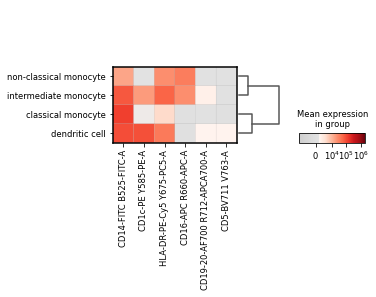

In [539]:
sc.pl.matrixplot(adata_mono, adata_mono.var_names, groupby='cell_types2', cmap=mymap, 
                 layer='compensated',
                 #swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=2e6),
                 dendrogram=True, #save='_' + today+'_louvain.pdf'
                )

In [43]:
adata_mono = sc.read('./../data/Hofer_IMA/mono_merge_monoDC_subset.h5ad')

In [44]:
adata_mono

AnnData object with n_obs × n_vars = 254552 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time', 'gate_root', 'gate_LymphoMono', 'gate_non B-cells', 'gate_singlets', 'gate_non HLA-DR', 'gate_CD1c+', 'gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+', 'gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+', 'gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-', 'gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-', 'gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono', 'batch', 'manual annotation level 1', 'manual annotation level 2', 'leiden', 'cell_types', 'cell_types_lvl2', 'leiden_mono', 'leiden_mono_R', 'cell_types2'
    var: 'channel', 'marker', 'signal_type'
    uns: 'cell_types2_colors', 'cell_types_colors', 'cell_types_lvl2_colors', 'dendrogram_cell_types', 'dendrogram_cell_types2', 'dendrogr

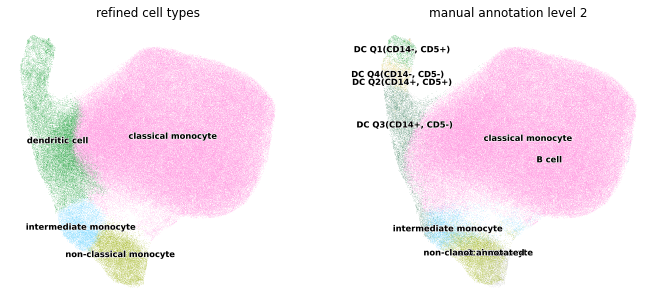

In [541]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_mono, color=['cell_types2', 'manual annotation level 2'], 
           title='refined cell types',
           legend_loc='on data', 
           legend_fontoutline=1,
           frameon=False,
           legend_fontsize='small', save=today+ '_rough_cell_types.png'
          )

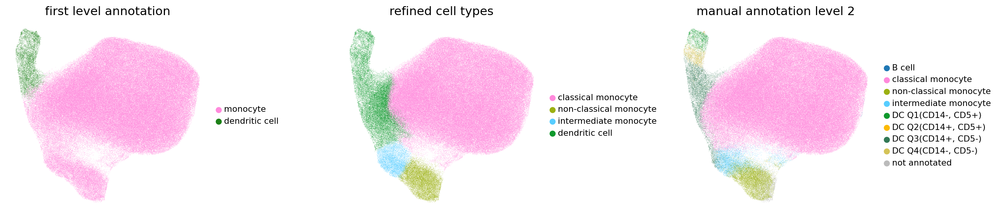

In [57]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_mono, color=['cell_types','cell_types2', 'manual annotation level 2'], 
           title=['first level annotation','refined cell types', 'manual annotation level 2'],
           frameon=False,
           legend_loc='right margin', 
           legend_fontoutline=1, wspace=0.5,
           legend_fontsize='x-small', 
           save=today+ '_rough_cell_types2.pdf'
          )

Add refined monocyte annotation to full dataset.

In [543]:
adata.obs['cell_types_lvl2'] = adata.obs['cell_types'].cat.add_categories(['classical monocyte', 
                                                                            'non-classical monocyte', 
                                                                            'intermediate monocyte',
                                                                           # 'myeloid-derived suppressor cell'
                                                                           
                                                                            ])
adata_mono.obs['cell_types2'] = adata_mono.obs['cell_types2'].cat.add_categories(
    np.setdiff1d(adata.obs['cell_types'].cat.categories, adata_mono.obs['cell_types2'].cat.categories)
)
adata.obs['cell_types_lvl2'][adata.obs['cell_types'].isin(['monocyte', 'dendritic cell'])] = adata_mono.obs['cell_types2']

adata.obs['cell_types_lvl2'] = adata.obs['cell_types_lvl2'].cat.remove_unused_categories()

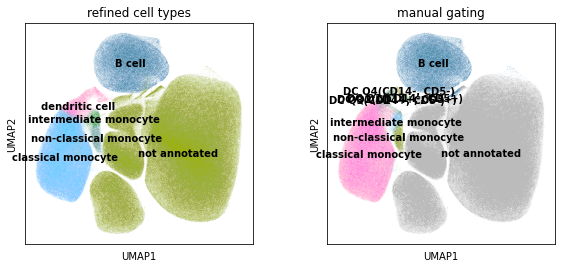

In [544]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color=['cell_types_lvl2', 'manual annotation level 2'], #save=today+ '_rough_cell_types.png',
           title=['refined cell types', 'manual gating'],
           legend_loc='on data')

Compute the normalised cluster size.

In [545]:
pd.value_counts(adata.obs['cell_types'], normalize=True)

not annotated     0.724841
monocyte          0.173237
B cell            0.096841
dendritic cell    0.005082
Name: cell_types, dtype: float64

In [546]:
pd.value_counts(adata.obs['cell_types_lvl2'], normalize=True)

not annotated             0.724841
classical monocyte        0.146161
B cell                    0.096841
dendritic cell            0.018707
non-classical monocyte    0.008623
intermediate monocyte     0.004828
Name: cell_types_lvl2, dtype: float64

In [547]:
pd.crosstab(adata.obs['cell_types_lvl2'], 
            adata.obs['sample'], 
            margins=True, normalize='columns')

sample,KR,KW,MF,All
cell_types_lvl2,,,,
B cell,0.062884,0.099464,0.128787,0.096841
dendritic cell,0.017778,0.013328,0.026114,0.018707
not annotated,0.770435,0.689904,0.719603,0.724841
classical monocyte,0.137229,0.183499,0.110636,0.146161
non-classical monocyte,0.006008,0.009357,0.010444,0.008623
intermediate monocyte,0.005666,0.004448,0.004417,0.004828


In [548]:
pd.crosstab(adata.obs['cell_types_lvl2'], 
            adata.obs['sample'], 
            margins=True)

sample,KR,KW,MF,All
cell_types_lvl2,,,,
B cell,28701,52658,56883,138242
dendritic cell,8114,7056,11534,26704
not annotated,351636,365249,317837,1034722
classical monocyte,62633,97148,48866,208647
non-classical monocyte,2742,4954,4613,12309
intermediate monocyte,2586,2355,1951,6892
All,456412,529420,441684,1427516


In [549]:
pd.crosstab(adata.obs['cell_types_lvl2'], 
            adata.obs['manual annotation level 2'])

manual annotation level 2,B cell,classical monocyte,non-classical monocyte,intermediate monocyte,"DC Q1(CD14-, CD5+)","DC Q2(CD14+, CD5+)","DC Q3(CD14+, CD5-)","DC Q4(CD14-, CD5-)",not annotated
cell_types_lvl2,,,,,,,,,
B cell,138096,0,0,0,8,0,1,48,89
dendritic cell,2,15753,0,3,1644,219,6799,1674,610
not annotated,3541,710,104,5,1,22,0,49,1030290
classical monocyte,26,207220,165,759,0,5,54,0,418
non-classical monocyte,5,4,9438,957,0,0,1,2,1902
intermediate monocyte,4,786,813,4404,0,23,784,0,78


Of note, there is some variation where to draw the boundaries between dendritic cells and the monocyte populations. When annotating clusters, we assign entire populations to a certain subpopulation and trust the boundary setting of the algorithm. That might be a little different than the annotation based on manual gating.

In [550]:
adata_mono.write('./../data/Hofer_IMA/mono_merge_monoDC_subset.h5ad')

## Subcluster dendritic cells

In order to refine the dendritic cells into subsets, let us subcluster the dendritic cell population.

In [551]:
adata_dc = adata[adata.obs['cell_types_lvl2'].isin(['dendritic cell'])].copy()

In [552]:
adata_dc

AnnData object with n_obs × n_vars = 26704 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time', 'gate_root', 'gate_LymphoMono', 'gate_non B-cells', 'gate_singlets', 'gate_non HLA-DR', 'gate_CD1c+', 'gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+', 'gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+', 'gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-', 'gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-', 'gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono', 'batch', 'manual annotation level 1', 'manual annotation level 2', 'leiden', 'cell_types', 'cell_types_lvl2'
    var: 'channel', 'marker', 'signal_type'
    uns: 'cell_types_colors', 'dendrogram_cell_types', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'manual annotation level 1_colors', 'manual annotation level 2_colors', 'meta', 'ne

Recompute embedding.

In [553]:
sc.pp.neighbors(adata_dc)
sc.tl.umap(adata_dc)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


In [554]:
sc.tl.leiden(adata_dc, key_added='leiden_dc', resolution=1)

running Leiden clustering
    finished: found 22 clusters and added
    'leiden_dc', the cluster labels (adata.obs, categorical) (0:00:06)


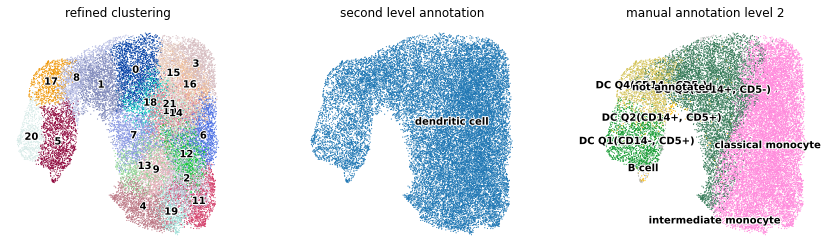

In [555]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_dc, color=['leiden_dc', 'cell_types_lvl2', 'manual annotation level 2'], 
           save=today+ '_DC_clustering.png',
           title=['refined clustering', 'second level annotation', 'manual annotation level 2'],
           legend_loc='on data', 
           legend_fontoutline=2,
           frameon=False,
           size=5)

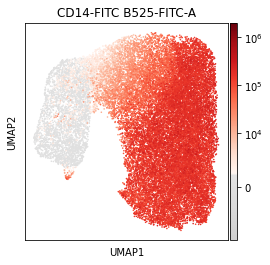

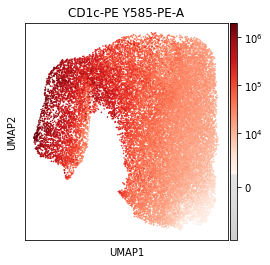

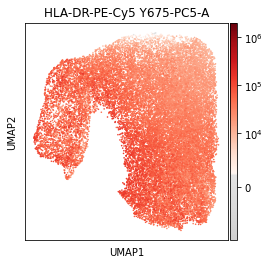

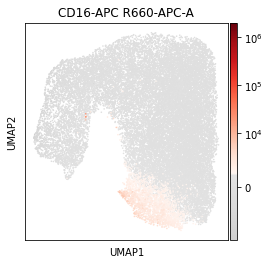

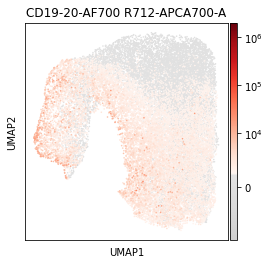

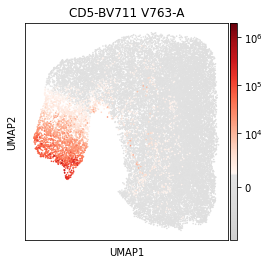

In [556]:
rcParams['figure.figsize']=(4,4)
for name in adata_mono.var_names:
    sc.pl.umap(adata_dc, color=name,
               color_map=mymap,
               layer='compensated',
               norm=colors.SymLogNorm(linthresh=1e4, 
                                      vmin=-1e4, vmax=2e6), 
               size=10, 
               save='_'+today +'_' +name +'_DC.png'
              )

In [557]:
sc.tl.dendrogram(adata_dc, 'leiden_dc')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden_dc']`


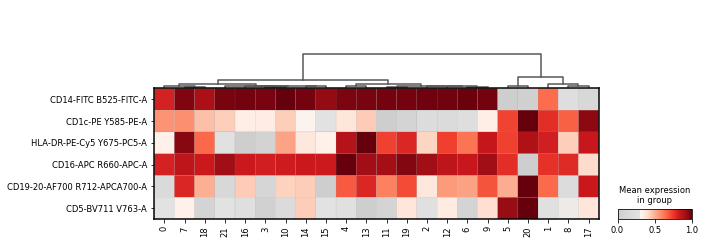

In [558]:
sc.pl.matrixplot(adata_dc, groupby='leiden_dc', dendrogram=True, swap_axes=True, standard_scale='var',
                 var_names=adata_dc.var_names, cmap=mymap, use_raw=False, log='True', 
                 save='_' + today+'_leiden_DC_scaled.pdf'
                ) 

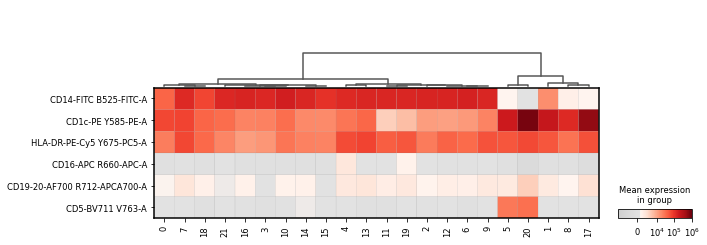

In [559]:
sc.pl.matrixplot(adata_dc, adata_dc.var_names, groupby='leiden_dc', 
                 cmap=mymap, layer='compensated', 
                 swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=1e6),
                 dendrogram=True, 
                 #save='_' + today+'_louvain.pdf'
                )

In [560]:
df = pd.DataFrame(data = adata_dc.layers['compensated'], 
                  index = adata_dc.obs_names, 
                  columns=adata_dc.var_names)


In [561]:
df['leiden']= pd.Series(adata_dc.obs['leiden_dc'], index=df.index)
df['leiden']= df['leiden'].cat.remove_unused_categories()

In [562]:
df_all = pd.DataFrame(pd.value_counts(adata_dc.obs['leiden_dc']).values,
                      index=pd.value_counts(adata_dc.obs['leiden_dc']).index,
                      columns=['leiden_dc_size'])

In [563]:
df_all['mean_CD14']=df.groupby(by='leiden')['CD14-FITC B525-FITC-A'].apply(np.median).values
df_all['mean_CD16']=df.groupby(by='leiden')['CD16-APC R660-APC-A'].apply(np.median).values
df_all['mean_CD1c']=df.groupby(by='leiden')['CD1c-PE Y585-PE-A'].apply(np.median).values
df_all['mean_CD19-20']=df.groupby(by='leiden')['CD19-20-AF700 R712-APCA700-A'].apply(np.median).values
df_all['mean_HLA-DR']=df.groupby(by='leiden')['HLA-DR-PE-Cy5 Y675-PC5-A'].apply(np.median).values
df_all['mean_CD5']=df.groupby(by='leiden')['CD5-BV711 V763-A'].apply(np.median).values

df_all['CD14_lowhigh'] = pd.cut(df_all['mean_CD14'], bins=[-1e6,1e3,5e3, 6e4, 1e7], labels=['lowest','low','medium', 'high'])
df_all['CD5_lowhigh'] = pd.cut(df_all['mean_CD5'], bins=[-1e6, 5e3, 1e7], labels=['low', 'high'])
df_all['CD16_lowhigh'] = pd.cut(df_all['mean_CD16'], bins=[-1e6, 2e4,6e4, 1e7], labels=['low', 'high', 'highest'])
df_all['CD1920_lowhigh'] = pd.cut(df_all['mean_CD19-20'], bins=[-1e6, 1e5, 1e7], labels=['low', 'high'])
df_all['HLA-DR_lowhigh'] = pd.cut(df_all['mean_HLA-DR'], bins=[-1e6, 4e3, 1e7], labels=['low', 'high'])
df_all['CD1c_lowhigh'] = pd.cut(df_all['mean_CD1c'], bins=[-1e6, 2e4, 1e7], labels=['low', 'high'])

We discriminate four different types of dendritic cells based on their levels of CD14 and CD5. 

* Q1: CD14 - CD5 +
* Q2: CD14 + CD5 + 
* Q3: CD14 + CD5 -
* Q4: CD14 - CD5 -

In [565]:
df_all['dendritic_cells'] = pd.Series(np.zeros(df_all.shape[0]))

#'DC Q1(CD14-, CD5+)',
#'DC Q2(CD14+, CD5+)', 
#'DC Q3(CD14+, CD5-)',
#'DC Q4(CD14-, CD5-)',


df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh'].isin(['low','lowest']), 
                                         df_all['CD5_lowhigh']=='high')] = 'DC Q1(CD14-, CD5+)' 
df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', 
                                         df_all['CD5_lowhigh']=='high')] = 'DC Q2(CD14+, CD5+)' 
df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh'].isin(['medium','high']), 
                                         df_all['CD5_lowhigh']=='low')] = 'DC Q3(CD14+, CD5-)' 
df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh'].isin(['low','lowest']), 
                                         df_all['CD5_lowhigh']=='low')] = 'DC Q4(CD14-, CD5-)' 

df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', 
                                   df_all['CD16_lowhigh']=='high')] = 'intermediate monocyte'
df_all['dendritic_cells'].iloc[np.logical_and(np.logical_and(df_all['CD14_lowhigh']=='low', 
                                   df_all['CD16_lowhigh']=='high'), 
                                   df_all['HLA-DR_lowhigh']=='high')] = 'non-classical monocyte'
df_all['dendritic_cells'].iloc[np.logical_and(df_all['CD14_lowhigh']=='high', 
                                        df_all['CD16_lowhigh']=='low')] = 'classical monocyte'

/opt/python/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


We have annotated the monocytes roughly based on simple thresholds. Let us rename and summarize the `leiden` clusters to the corresponding cell types.

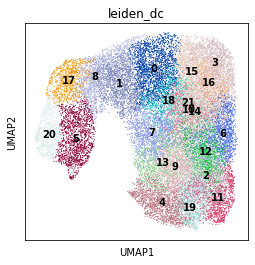

In [567]:
sc.pl.umap(adata_dc, color='leiden_dc', legend_loc='on data')

In [568]:
cell_type_dict = {}
for idx in df_all.index:
    cell_type_dict[idx] = df_all['dendritic_cells'][idx]

adata_dc.obs['cell_types3']= adata_dc.obs['leiden_dc'].map(cell_type_dict).astype('category')
    
adata_dc.obs['cell_types3']= adata_dc.obs['cell_types3'].cat.remove_unused_categories()

In [570]:
adata_dc.obs['cell_types3'] = adata_dc.obs['cell_types3'].cat.reorder_categories([
 'classical monocyte', 'DC Q1(CD14-, CD5+)', 'DC Q3(CD14+, CD5-)',
       'DC Q4(CD14-, CD5-)'
])

In [571]:
sc.tl.dendrogram(adata_dc, groupby='cell_types3')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cell_types3']`


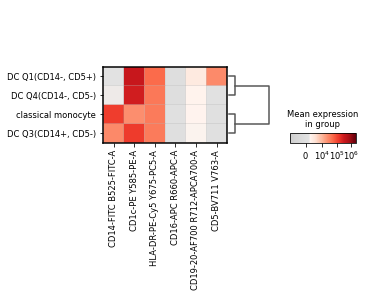

In [572]:
sc.pl.matrixplot(adata_dc, adata_dc.var_names, groupby='cell_types3', cmap=mymap, 
                 layer='compensated',
                 #swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=2e6),
                 dendrogram=True, #save='_' + today+'_louvain.pdf'
                )

In [77]:
adata_dc.uns['cell_types3_colors'] = list()

adata_dc.uns['cell_types3_colors'].append('#ff8adc') # class monocytes
#adata_dc.uns['cell_types3_colors'].append('#9bb011') # non-class monocytes
#adata_dc.uns['cell_types3_colors'].append('#57cdff') # intermediate monocytes
adata_dc.uns['cell_types3_colors'].append('#0f992d') # DC Q1
#adata_dc.uns['cell_types3_colors'].append('#fcba03') # DC Q2
adata_dc.uns['cell_types3_colors'].append('#327855') # DC Q3
adata_dc.uns['cell_types3_colors'].append('#d4c357') # DC Q4
adata_dc.uns['cell_types3_colors'].append('#bbbbbb') #not annotated

In [59]:
adata_dc = sc.read('./../data/Hofer_IMA/mono_merge_DC_subset.h5ad')

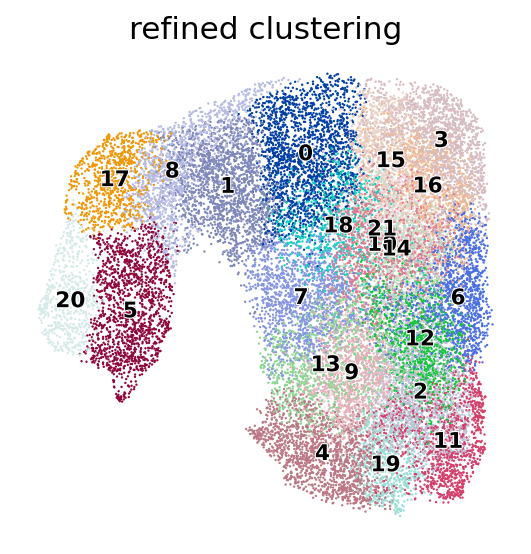

In [60]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_dc, color=['leiden_dc'],
           title=['refined clustering'],
           frameon=False,
           legend_loc='on data',  #
           legend_fontsize='x-small',
           save=today+ '_leiden_DC.pdf',
           legend_fontoutline=1)

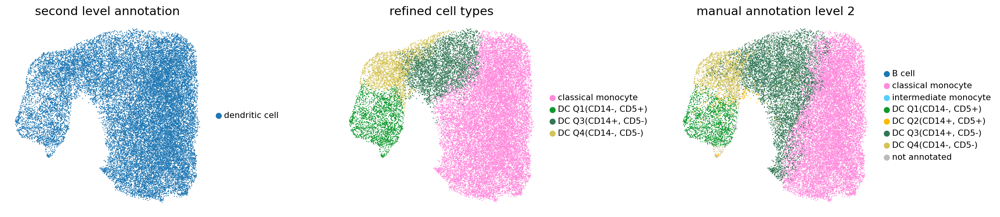

In [78]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_dc, color=['cell_types_lvl2','cell_types3', 'manual annotation level 2'], 
           save=today+ '_dc_subtypes.pdf',
           frameon=False,
           wspace=0.5,
           title=['second level annotation','refined cell types', 'manual annotation level 2'],
           legend_loc='right margin', 
           legend_fontsize='x-small',
           size=5)

In [575]:
pd.crosstab(adata_dc.obs['cell_types3'], 
            adata_dc.obs['manual annotation level 2'])

manual annotation level 2,B cell,classical monocyte,intermediate monocyte,"DC Q1(CD14-, CD5+)","DC Q2(CD14+, CD5+)","DC Q3(CD14+, CD5-)","DC Q4(CD14-, CD5-)",not annotated
cell_types3,,,,,,,,
classical monocyte,0,15675,3,0,26,2745,0,169
"DC Q1(CD14-, CD5+)",2,0,0,1622,105,9,210,183
"DC Q3(CD14+, CD5-)",0,78,0,0,56,3616,15,60
"DC Q4(CD14-, CD5-)",0,0,0,22,32,429,1449,198


Add refined dendritic cell annotation to full dataset.

In [576]:
adata.obs['cell_types_lvl2'] = adata.obs['cell_types_lvl2'].cat.add_categories(
    np.setdiff1d(adata_dc.obs['cell_types3'].cat.categories,adata.obs['cell_types_lvl2'].cat.categories)
)
adata_dc.obs['cell_types3'] = adata_dc.obs['cell_types3'].cat.add_categories(
    np.setdiff1d(adata.obs['cell_types_lvl2'].cat.categories, adata_dc.obs['cell_types3'].cat.categories)
)
adata.obs['cell_types_lvl2'][adata.obs['cell_types_lvl2']=='dendritic cell'] = adata_dc.obs['cell_types3']
adata.obs['cell_types_lvl2'] = adata.obs['cell_types_lvl2'].cat.remove_unused_categories()

Compute the normalised cluster size.

In [577]:
pd.value_counts(adata.obs['cell_types'], normalize=True)

not annotated     0.724841
monocyte          0.173237
B cell            0.096841
dendritic cell    0.005082
Name: cell_types, dtype: float64

In [578]:
pd.value_counts(adata.obs['cell_types_lvl2'], normalize=True)

not annotated             0.724841
classical monocyte        0.159203
B cell                    0.096841
non-classical monocyte    0.008623
intermediate monocyte     0.004828
DC Q3(CD14+, CD5-)        0.002679
DC Q1(CD14-, CD5+)        0.001493
DC Q4(CD14-, CD5-)        0.001492
Name: cell_types_lvl2, dtype: float64

In [579]:
pd.crosstab(adata.obs['cell_types_lvl2'], 
            adata.obs['sample'], 
            margins=True, normalize='columns')

sample,KR,KW,MF,All
cell_types_lvl2,,,,
B cell,0.062884,0.099464,0.128787,0.096841
not annotated,0.770435,0.689904,0.719603,0.724841
classical monocyte,0.149641,0.192683,0.128954,0.159203
non-classical monocyte,0.006008,0.009357,0.010444,0.008623
intermediate monocyte,0.005666,0.004448,0.004417,0.004828
"DC Q1(CD14-, CD5+)",0.001363,0.000793,0.002466,0.001493
"DC Q3(CD14+, CD5-)",0.002305,0.002588,0.003176,0.002679
"DC Q4(CD14-, CD5-)",0.001698,0.000763,0.002153,0.001492


In [580]:
pd.crosstab(adata.obs['cell_types_lvl2'], 
            adata.obs['sample'], 
            margins=True)

sample,KR,KW,MF,All
cell_types_lvl2,,,,
B cell,28701,52658,56883,138242
not annotated,351636,365249,317837,1034722
classical monocyte,68298,102010,56957,227265
non-classical monocyte,2742,4954,4613,12309
intermediate monocyte,2586,2355,1951,6892
"DC Q1(CD14-, CD5+)",622,420,1089,2131
"DC Q3(CD14+, CD5-)",1052,1370,1403,3825
"DC Q4(CD14-, CD5-)",775,404,951,2130
All,456412,529420,441684,1427516


In [581]:
pd.crosstab(adata.obs['cell_types_lvl2'], 
            adata.obs['manual annotation level 2'])

manual annotation level 2,B cell,classical monocyte,non-classical monocyte,intermediate monocyte,"DC Q1(CD14-, CD5+)","DC Q2(CD14+, CD5+)","DC Q3(CD14+, CD5-)","DC Q4(CD14-, CD5-)",not annotated
cell_types_lvl2,,,,,,,,,
B cell,138096,0,0,0,8,0,1,48,89
not annotated,3541,710,104,5,1,22,0,49,1030290
classical monocyte,26,222895,165,762,0,31,2799,0,587
non-classical monocyte,5,4,9438,957,0,0,1,2,1902
intermediate monocyte,4,786,813,4404,0,23,784,0,78
"DC Q1(CD14-, CD5+)",2,0,0,0,1622,105,9,210,183
"DC Q3(CD14+, CD5-)",0,78,0,0,0,56,3616,15,60
"DC Q4(CD14-, CD5-)",0,0,0,0,22,32,429,1449,198


In [582]:
adata_dc.write('./../data/Hofer_IMA/mono_merge_DC_subset.h5ad')

# Set final annotation

In the different subclustering steps, we have re-assigned certain labels, for instance, `not annotated` and `dendritic cell`. Let us unify the annotation across levels.

In [583]:
pd.crosstab(adata.obs['cell_types'], adata.obs['cell_types_lvl2'])

cell_types_lvl2,B cell,not annotated,classical monocyte,non-classical monocyte,intermediate monocyte,"DC Q1(CD14-, CD5+)","DC Q3(CD14+, CD5-)","DC Q4(CD14-, CD5-)"
cell_types,,,,,,,,
B cell,138242,0,0,0,0,0,0,0
monocyte,0,0,227265,12309,6892,0,832,0
dendritic cell,0,0,0,0,0,2131,2993,2130
not annotated,0,1034722,0,0,0,0,0,0


In [584]:
adata.obs['cell_types_lvl2'].cat.categories

Index(['B cell', 'not annotated', 'classical monocyte',
       'non-classical monocyte', 'intermediate monocyte', 'DC Q1(CD14-, CD5+)',
       'DC Q3(CD14+, CD5-)', 'DC Q4(CD14-, CD5-)'],
      dtype='object')

In [585]:
adata.obs['cell_types'][adata.obs['cell_types_lvl2'].isin(['dendritic cell Q1',
       'dendritic cell Q3', 'dendritic cell Q4'])] = 'dendritic cell'
#cleanup labels
adata.obs['cell_types_lvl2'][adata.obs['cell_types_lvl2']=='intermediate'] = 'intermediate monocyte'
adata.obs['cell_types_lvl2'][adata.obs['cell_types_lvl2']=='classical'] = 'classical monocyte'

adata.obs['cell_types'][adata.obs['cell_types_lvl2'].isin(['classical monocyte', 
                                                           'non-classical monocyte',
                                                           'intermediate monocyte',
                                                           'myeloid-derived suppressor cell'
                                                          ])] = 'monocyte'
adata.obs['cell_types'][adata.obs['cell_types_lvl2'].isin(['not annotated'])] = 'not annotated'


adata.obs['cell_types'] = adata.obs['cell_types'].cat.remove_unused_categories()
adata.obs['cell_types_lvl2'] = adata.obs['cell_types_lvl2'].cat.remove_unused_categories()

In [586]:
pd.crosstab(adata.obs['cell_types'], adata.obs['cell_types_lvl2'])

cell_types_lvl2,B cell,not annotated,classical monocyte,non-classical monocyte,intermediate monocyte,"DC Q1(CD14-, CD5+)","DC Q3(CD14+, CD5-)","DC Q4(CD14-, CD5-)"
cell_types,,,,,,,,
B cell,138242,0,0,0,0,0,0,0
monocyte,0,0,227265,12309,6892,0,832,0
dendritic cell,0,0,0,0,0,2131,2993,2130
not annotated,0,1034722,0,0,0,0,0,0


## Visualise cell type annotation

In [587]:
adata.obs['cell_types_lvl2'].cat.categories

Index(['B cell', 'not annotated', 'classical monocyte',
       'non-classical monocyte', 'intermediate monocyte', 'DC Q1(CD14-, CD5+)',
       'DC Q3(CD14+, CD5-)', 'DC Q4(CD14-, CD5-)'],
      dtype='object')

In [591]:
adata.obs['cell_types_lvl2'] = adata.obs['cell_types_lvl2'].cat.reorder_categories([
 'B cell', 'classical monocyte',
       'non-classical monocyte', 'intermediate monocyte',
    'DC Q1(CD14-, CD5+)',
       'DC Q3(CD14+, CD5-)', 'DC Q4(CD14-, CD5-)', 'not annotated'
])

In [593]:
adata.uns['cell_types_lvl2_colors'] = list()
adata.uns['cell_types_lvl2_colors'].append('#1f77b4') #B cell
adata.uns['cell_types_lvl2_colors'].append('#ff8adc') # class monocytes
adata.uns['cell_types_lvl2_colors'].append('#9bb011') # non-class monocytes
adata.uns['cell_types_lvl2_colors'].append('#57cdff') # intermediate monocytes
adata.uns['cell_types_lvl2_colors'].append('#0f992d') # DC Q1
#adata.uns['cell_types_lvl2_colors'].append('#fcba03') # DC Q2
adata.uns['cell_types_lvl2_colors'].append('#327855') # DC Q3
adata.uns['cell_types_lvl2_colors'].append('#d4c357') # DC Q4
adata.uns['cell_types_lvl2_colors'].append('#bbbbbb') #not annotated

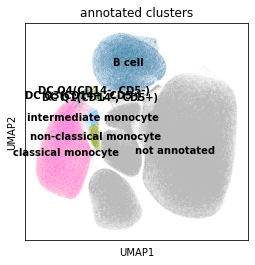

In [594]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata, color='cell_types_lvl2', legend_loc='on data', 
           title = 'annotated clusters'
          # save='_' +today + 'cell_type_annotation.png'
          )

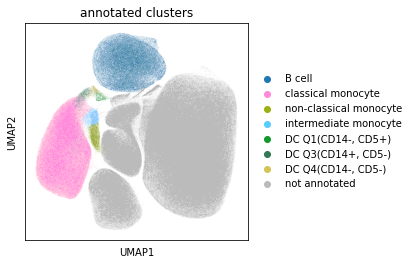

In [595]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata, color='cell_types_lvl2', 
           title = 'annotated clusters',
           save='_' +today + 'cluster_annotation.png'
          )

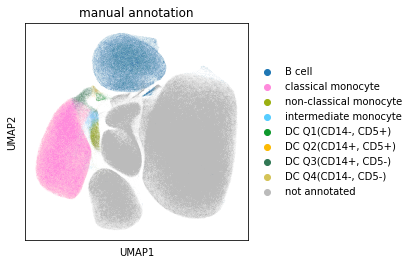

In [596]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata, color='manual annotation level 2', 
           title = 'manual annotation',
           save='_' +today + 'cell_type_annotation.png'
          )

In [597]:
import xlrd

In [598]:
pd.crosstab(adata.obs['cell_types'],adata.obs['sample'],
            normalize='columns').to_excel("./../table/Cluster_size_per_patient.xlsx", 
                                          sheet_name='Main cell types')
pd.crosstab(adata.obs['cell_types_lvl2'],adata.obs['sample'],
            normalize='columns').to_excel("./../table/Cluster_size_per_patient2.xlsx", 
                                          sheet_name='Monocytes DC refined')

In [599]:
adata.write('./../data/Hofer_IMA/mono_merge_annotated.h5ad')

## Visualise clusters and manual annotation without un-annotated cells

In [7]:
adata = sc.read('./../data/Hofer_IMA/mono_merge_annotated.h5ad')

Get subset of annotated cells in either clustering or manual annotation.

In [20]:
adata

AnnData object with n_obs × n_vars = 1427516 × 6
    obs: 'sample', 'FSC-H', 'FSC-A', 'SSC-H', 'SSC-A', 'CD14-FITC B525-FITC-H', 'CD1c-PE Y585-PE-H', 'HLA-DR-PE-Cy5 Y675-PC5-H', 'CD16-APC R660-APC-H', 'CD19-20-AF700 R712-APCA700-H', 'CD5-BV711 V763-H', 'FSC-Width', 'Time', 'gate_root', 'gate_LymphoMono', 'gate_non B-cells', 'gate_singlets', 'gate_non HLA-DR', 'gate_CD1c+', 'gate_Q1: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A+', 'gate_Q2: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A+', 'gate_Q3: CD14-FITC B525-FITC-A+ , CD5-BV711 V763-A-', 'gate_Q4: CD14-FITC B525-FITC-A- , CD5-BV711 V763-A-', 'gate_class. Mono', 'gate_intermed. Mono', 'gate_non-class. Mono', 'batch', 'manual annotation level 1', 'manual annotation level 2', 'leiden', 'cell_types', 'cell_types_lvl2'
    var: 'channel', 'marker', 'signal_type'
    uns: 'cell_types_colors', 'cell_types_lvl2_colors', 'dendrogram_cell_types', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'manual annotation level 1_colors', 'manual annotation 

In [31]:
adata_anno = adata[np.any(adata.obs[['cell_types', 
                                     'manual annotation level 1']]!='not annotated', 
                          axis=1)].copy()

In [33]:
adata_anno.obs[['cell_types', 'manual annotation level 1']].value_counts()

cell_types      manual annotation level 1
monocyte        monocyte                     240300
B cell          B cell                       138096
dendritic cell  dendritic cell                 6834
monocyte        dendritic cell                 4371
not annotated   B cell                         3541
monocyte        not annotated                  2592
not annotated   monocyte                        819
dendritic cell  not annotated                   416
B cell          not annotated                    89
not annotated   dendritic cell                   72
B cell          dendritic cell                   57
monocyte        B cell                           35
dendritic cell  B cell                            2
                monocyte                          2
dtype: int64

In [34]:
sc.tl.umap(adata_anno)

computing UMAP


/home/buettnerm/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:08:53)


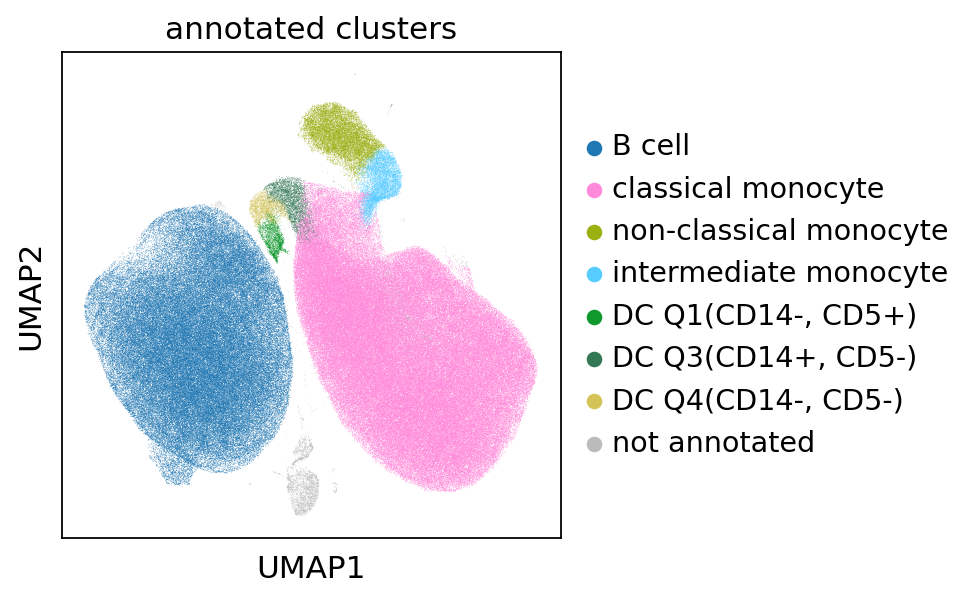

In [35]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata_anno, color='cell_types_lvl2', 
           title = 'annotated clusters',
           save='_' +today + 'cluster_annotation_anno_only.png'
          )

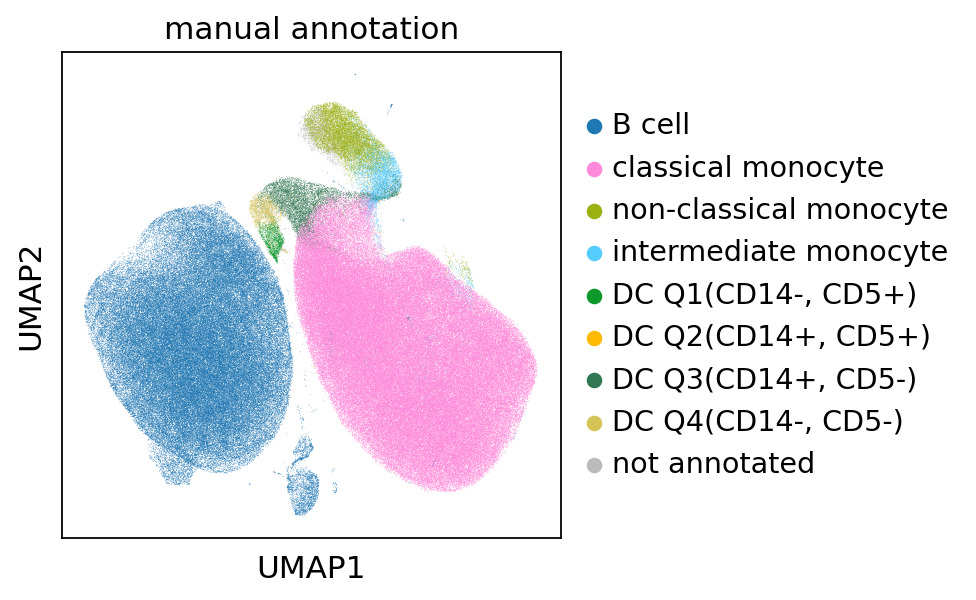

In [36]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata_anno, color='manual annotation level 2', 
           title = 'manual annotation',
           save='_' +today + 'cell_type_annotation_anno_only.png'
          )

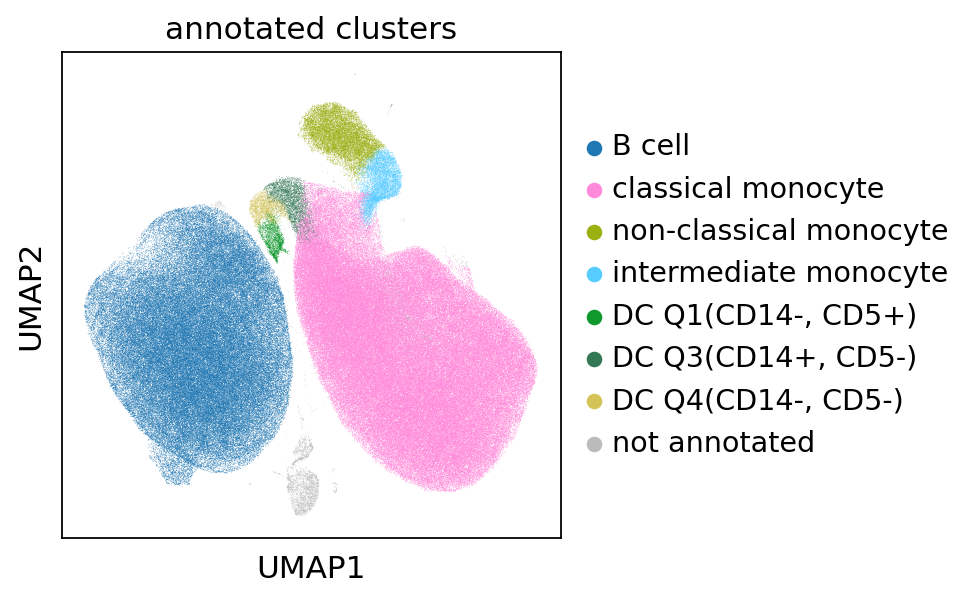

In [37]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata_anno, color='cell_types_lvl2', 
           title = 'annotated clusters',
           save='_' +today + 'cluster_annotation_anno_only.pdf'
          )

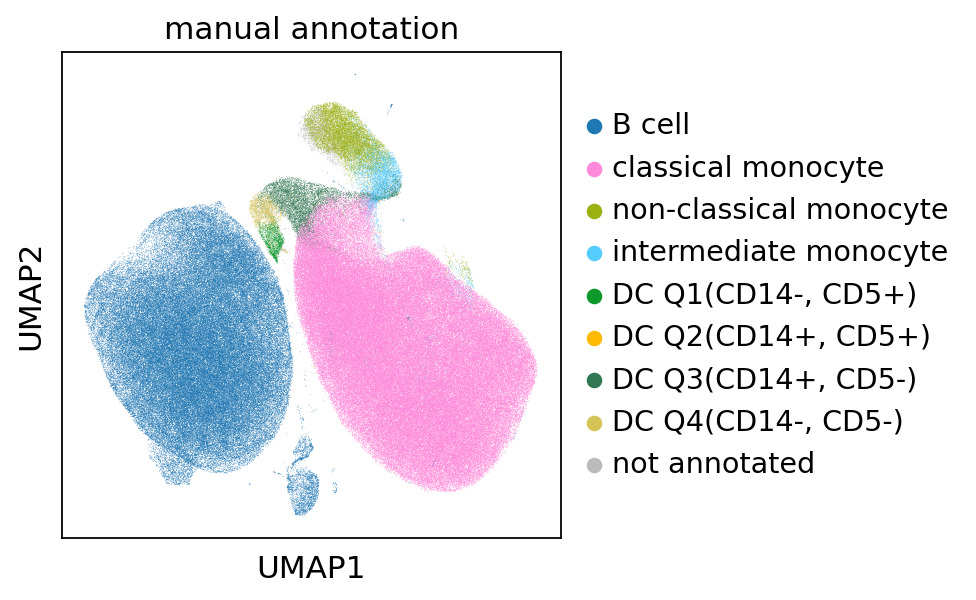

In [38]:
rcParams['figure.figsize']= (4,4)
sc.pl.umap(adata_anno, color='manual annotation level 2', 
           title = 'manual annotation',
           save='_' +today + 'cell_type_annotation_anno_only.pdf'
          )

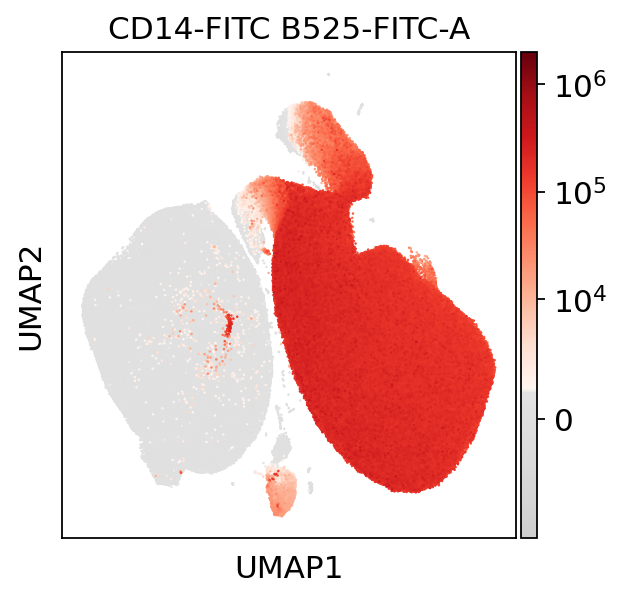

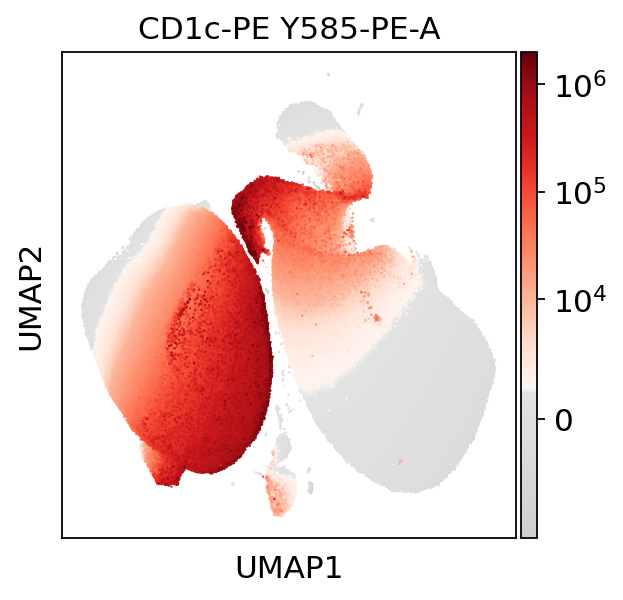

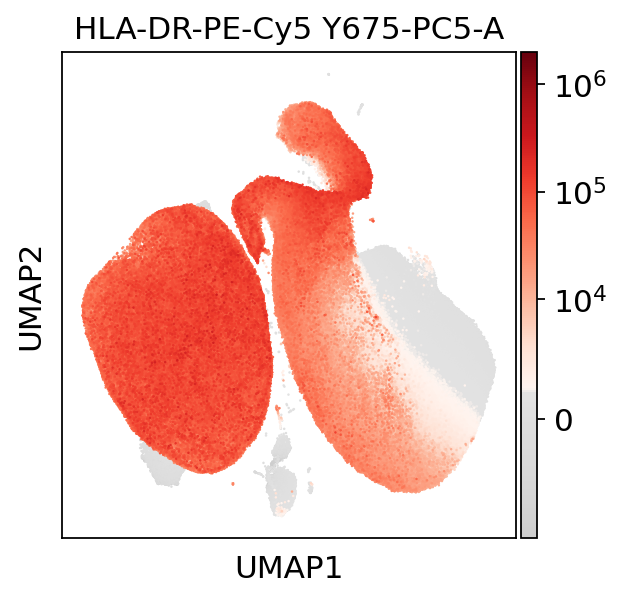

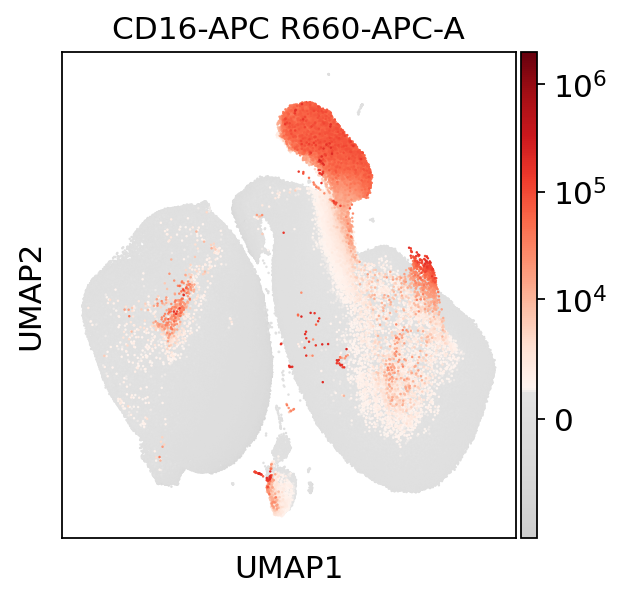

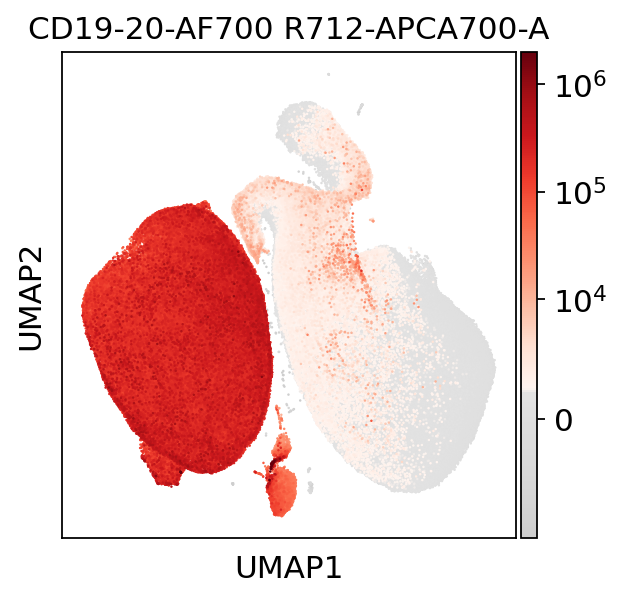

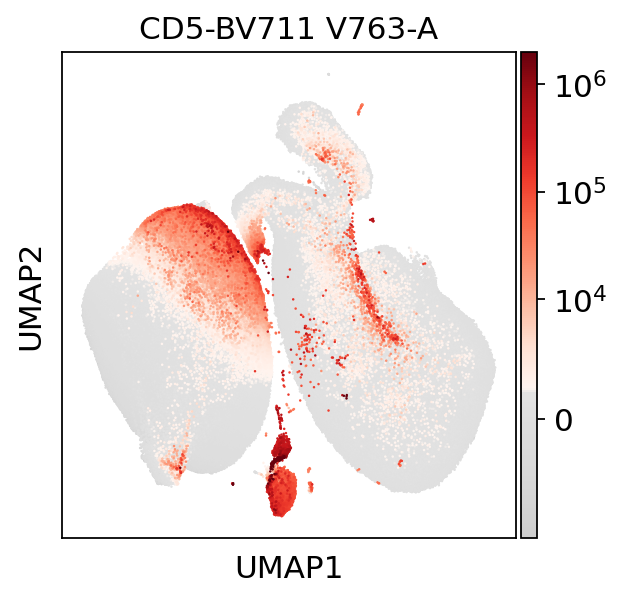

In [39]:
rcParams['figure.figsize']=(4,4)
for name in adata.var_names:
    sc.pl.umap(adata_anno, color=name,
               color_map=mymap,
               layer='compensated',
               norm=colors.SymLogNorm(linthresh=1e4, 
                                      vmin=-1e4, vmax=2e6), 
               size=5, 
               save='_'+today +'_' +name +'_anno_only.png'
              )

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cell_types_lvl2']`


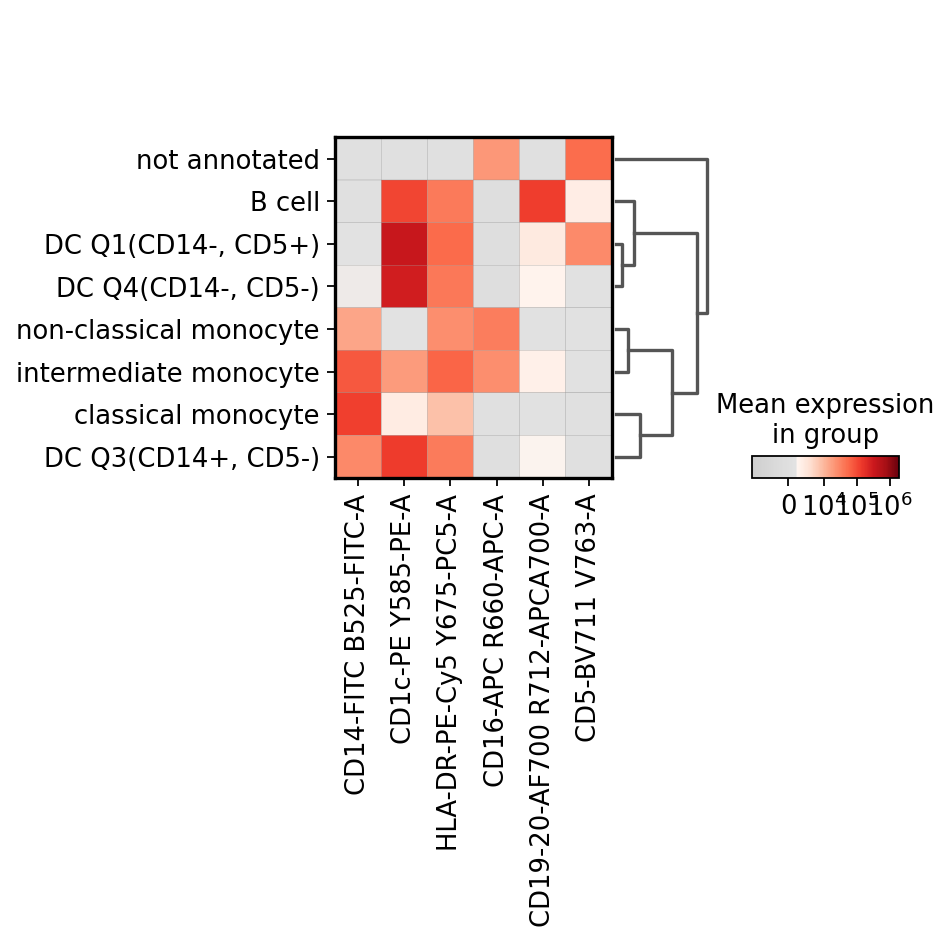

In [41]:
sc.pl.matrixplot(adata, adata.var_names, groupby='cell_types_lvl2', cmap=mymap, 
                 layer='compensated',
                 #swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=2e6),
                 dendrogram=True, 
                 save='_' + today+'_clustering_annotation_lvl2.pdf'
                )

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_manual annotation level 2']`


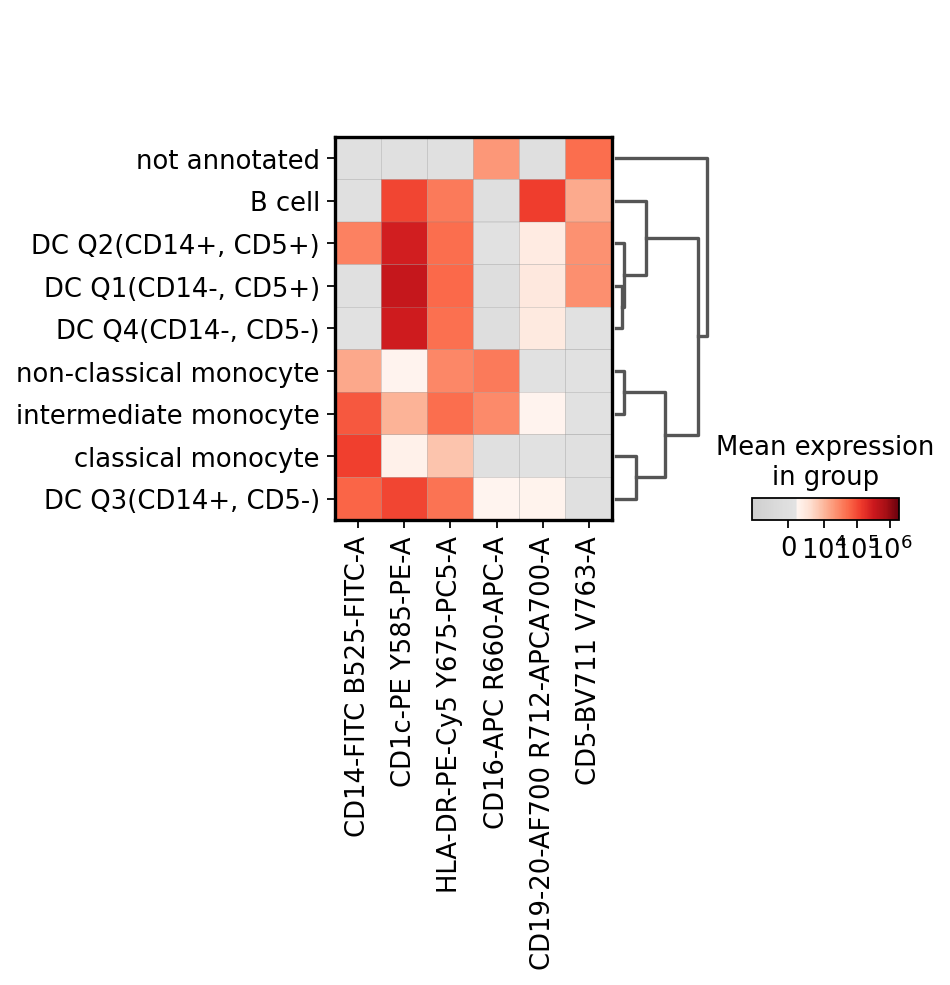

In [42]:
sc.pl.matrixplot(adata, adata.var_names, groupby='manual annotation level 2', cmap=mymap, 
                 layer='compensated',
                 #swap_axes=True,
                 norm=colors.SymLogNorm(linthresh=1e4, vmin=-1e4, vmax=2e6),
                 dendrogram=True, 
                 save='_' + today+'_manual_annotation_lvl2.pdf'
                )

## Visualise clusters in scatter plots

In [335]:
adata = sc.read('./../data/Hofer_IMA/mono_merge_annotated.h5ad')

Use same color scheme as above.

Plot with biexponential scaling.

/tmp/ipykernel_3202318/1403677231.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/1403677231.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


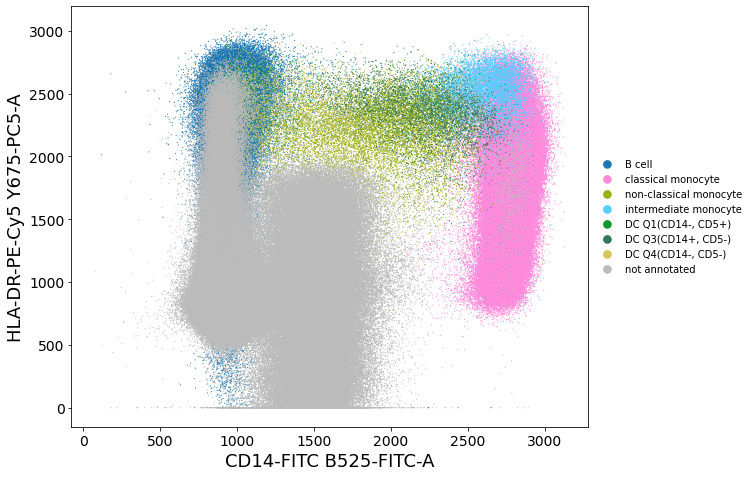

/tmp/ipykernel_3202318/1403677231.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/1403677231.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


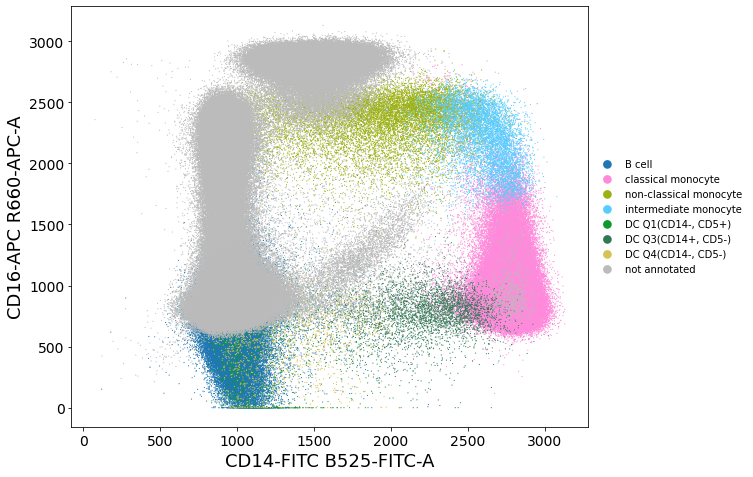

/tmp/ipykernel_3202318/1403677231.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/1403677231.py:55: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


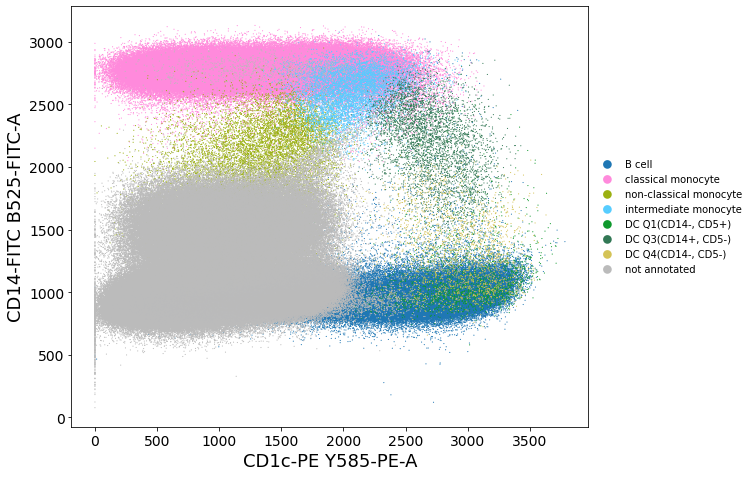

/tmp/ipykernel_3202318/1403677231.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/1403677231.py:76: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


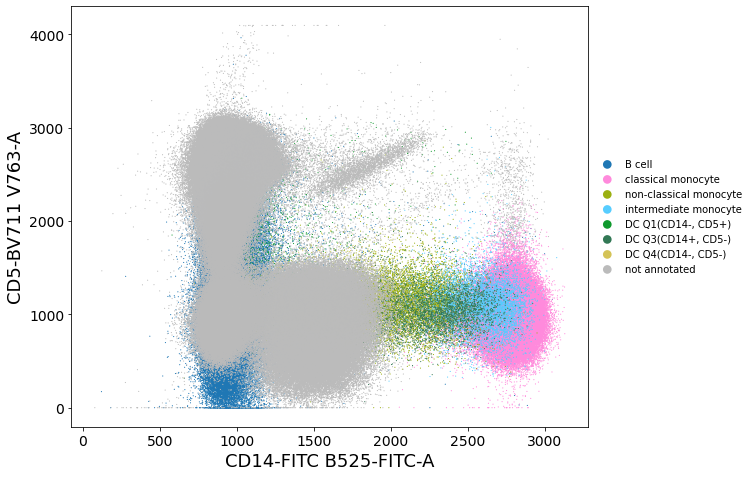

In [601]:
rcParams['figure.figsize']=(8,8)
ax = sc.pl.scatter(adata, 'CD14-FITC B525-FITC-A', 'HLA-DR-PE-Cy5 Y675-PC5-A', 
                   #layers='compensated',
              #save='_' + today+'_CD14_HLA.png',
              color='cell_types_lvl2', size=5, show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e2, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_CD14_HLA.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()
ax = sc.pl.scatter(adata, 'CD14-FITC B525-FITC-A', 'CD16-APC R660-APC-A',
                 #  layers='compensated',
              #save='_' + today+'_CD14_CD16.png',
              color='cell_types_lvl2', size=5, show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_CD14_CD16.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

ax = sc.pl.scatter(adata, 'CD1c-PE Y585-PE-A', 'CD14-FITC B525-FITC-A',
                 #  layers='compensated',
              #save='_' + today+'_CD14_CD16.png',
              color='cell_types_lvl2', size=5, 
                   show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_CD1c_CD14.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

ax = sc.pl.scatter(adata, 'CD14-FITC B525-FITC-A','CD5-BV711 V763-A', 
                 #  layers='compensated',
              #save='_' + today+'_CD1c_CD14.png', show=False,
              color='cell_types_lvl2', size=5, show=False)
#plt.xscale('symlog', linthresh=2e3)
#plt.yscale('symlog', linthresh=1e4)
#plt.xlim(-1e2, 1e7)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_CD14_CD5.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()


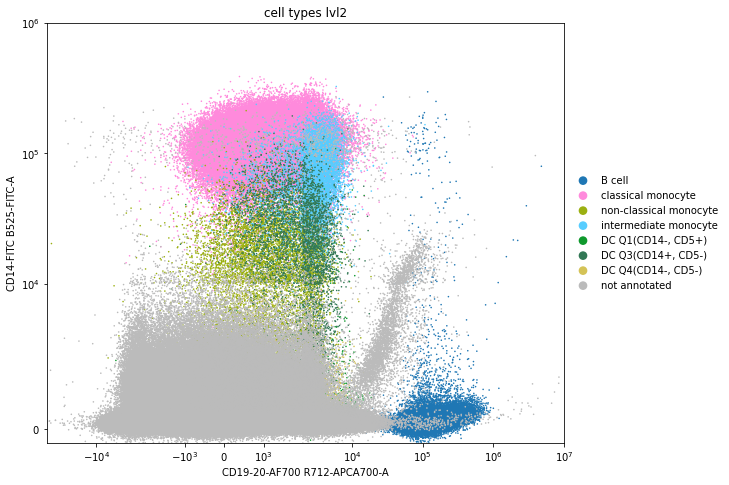

In [602]:
rcParams['figure.figsize']=(8,8)
ax = sc.pl.scatter(adata, 'CD19-20-AF700 R712-APCA700-A', 'CD14-FITC B525-FITC-A', 
                   layers='compensated',
              #save='_' + today+'_CD1c_CD14.png', show=False,
              color='cell_types_lvl2', size=10, show=False)
plt.xscale('symlog', linthresh=2e3)
plt.yscale('symlog', linthresh=1e4)
plt.xlim(-5e4, 1e7)
plt.ylim(-1e3, 1e6)
plt.show()

/tmp/ipykernel_3202318/1104887801.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/1104887801.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


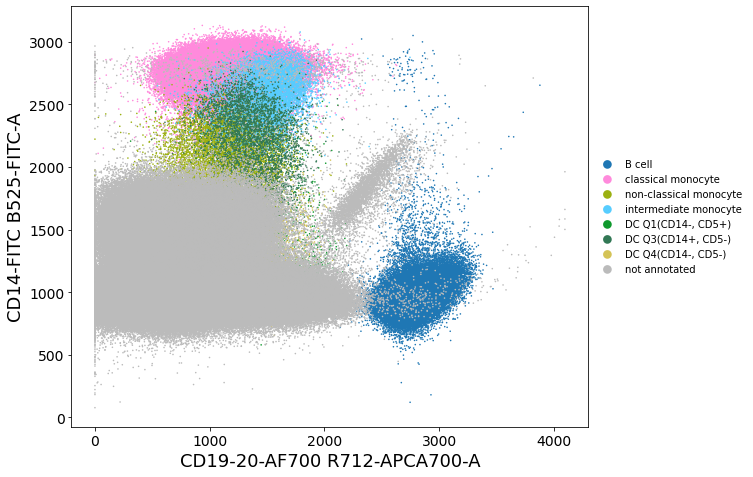

In [603]:
rcParams['figure.figsize']=(8,8)
ax = sc.pl.scatter(adata, 'CD19-20-AF700 R712-APCA700-A', 'CD14-FITC B525-FITC-A', 
                  # layers='compensated',
              #save='_' + today+'_CD1c_CD14.png', show=False,
              color='cell_types_lvl2', size=10, show=False)
#plt.xscale('symlog', linthresh=2e3)
#plt.yscale('symlog', linthresh=1e4)
#plt.xlim(-1e2, 1e7)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_CD1920_CD14.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

Remove "not annotated" cells from scatter plot.

In [604]:
adata_tmp = adata[adata.obs['cell_types_lvl2']!='not annotated'].copy()

/tmp/ipykernel_3202318/2868369818.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/2868369818.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


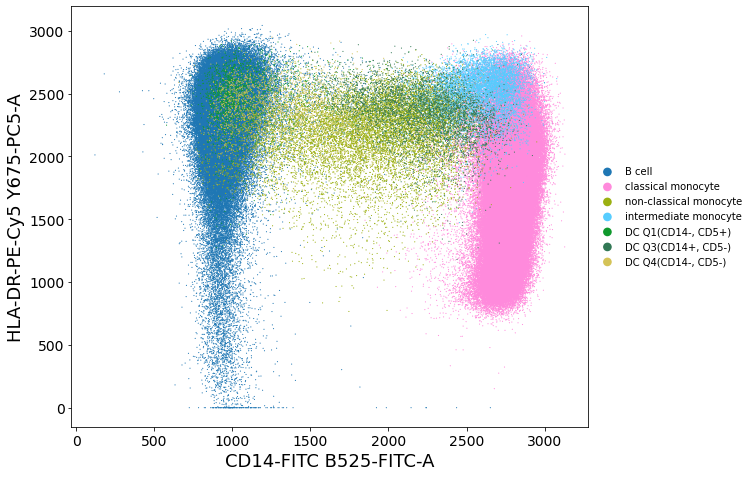

/tmp/ipykernel_3202318/2868369818.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/2868369818.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


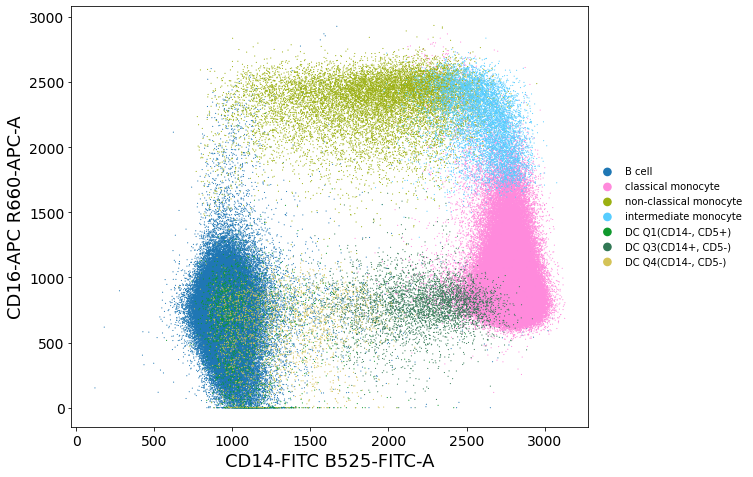

/tmp/ipykernel_3202318/2868369818.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/2868369818.py:55: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


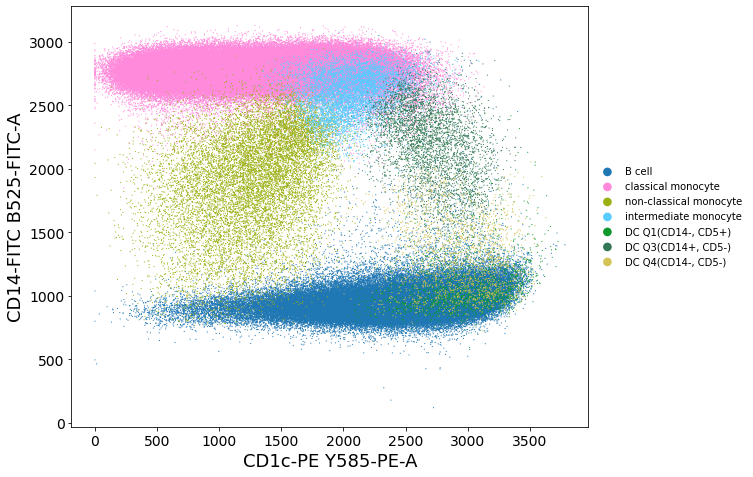

/tmp/ipykernel_3202318/2868369818.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/2868369818.py:77: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


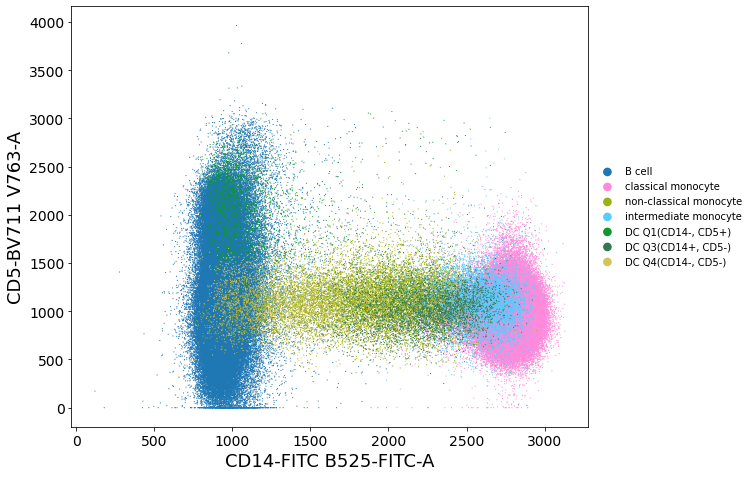

In [605]:
rcParams['figure.figsize']=(8,8)
ax = sc.pl.scatter(adata_tmp, 'CD14-FITC B525-FITC-A', 'HLA-DR-PE-Cy5 Y675-PC5-A', 
                   #layers='compensated',
              #save='_' + today+'_CD14_HLA.png',
              color='cell_types_lvl2', size=5, show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e2, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_cleaned_CD14_HLA.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()
ax = sc.pl.scatter(adata_tmp, 'CD14-FITC B525-FITC-A', 'CD16-APC R660-APC-A',
                 #  layers='compensated',
              #save='_' + today+'_CD14_CD16.png',
              color='cell_types_lvl2', size=5, show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_cleaned_CD14_CD16.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()


ax = sc.pl.scatter(adata_tmp, 'CD1c-PE Y585-PE-A', 'CD14-FITC B525-FITC-A', 
                 #  layers='compensated',
              #save='_' + today+'_CD1c_CD14.png', show=False,
              color='cell_types_lvl2', size=5, show=False)
#plt.xscale('symlog', linthresh=2e3)
#plt.yscale('symlog', linthresh=1e4)
#plt.xlim(-1e2, 1e7)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_cleaned_CD1c_CD14.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

ax = sc.pl.scatter(adata_tmp, 'CD14-FITC B525-FITC-A','CD5-BV711 V763-A',
                 #  layers='compensated',
              #save='_' + today+'_CD14_CD16.png',
              color='cell_types_lvl2', size=5, 
                   show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')
plt.savefig(fname = './figures/scatter_' + today +  '_cleaned_CD14_CD5.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()


/tmp/ipykernel_3202318/3482089189.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels, fontsize=14)
/tmp/ipykernel_3202318/3482089189.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=14)


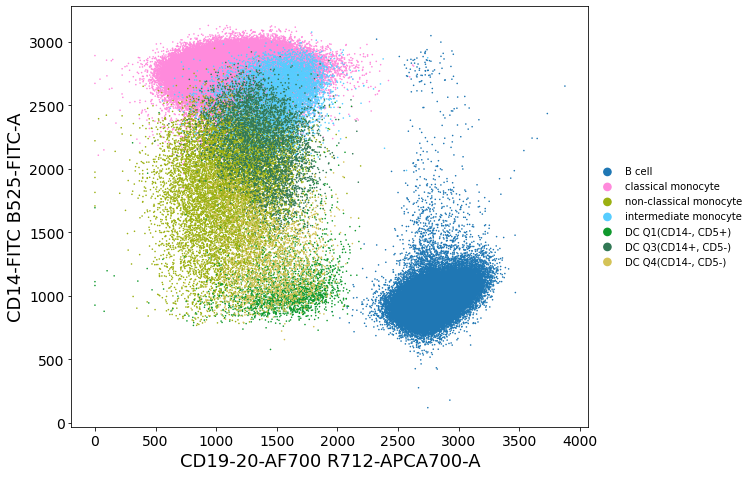

In [606]:
rcParams['figure.figsize']=(8,8)
ax = sc.pl.scatter(adata_tmp, 'CD19-20-AF700 R712-APCA700-A', 'CD14-FITC B525-FITC-A', 
                  # layers='compensated',
              #save='_' + today+'_CD1c_CD14.png', show=False,
              color='cell_types_lvl2', size=10, show=False)
#plt.xscale('symlog', linthresh=2e3)
#plt.yscale('symlog', linthresh=1e4)
#plt.xlim(-1e2, 1e7)
#plt.ylim(-1e3, 1e6)
labels = [int(item) for item in ax.get_yticks()]
ax.set_yticklabels(labels, fontsize=14)
labels = [int(item) for item in ax.get_xticks()]
ax.set_xticklabels(labels, fontsize=14)

ax.xaxis.get_label().set_fontsize(18)
ax.yaxis.get_label().set_fontsize(18)

plt.title('')


plt.savefig(fname = './figures/scatter_' + today +  '_cleaned_CD1920_CD14.png', 
            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

Distributions per parameter separately by cluster.

/opt/python/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


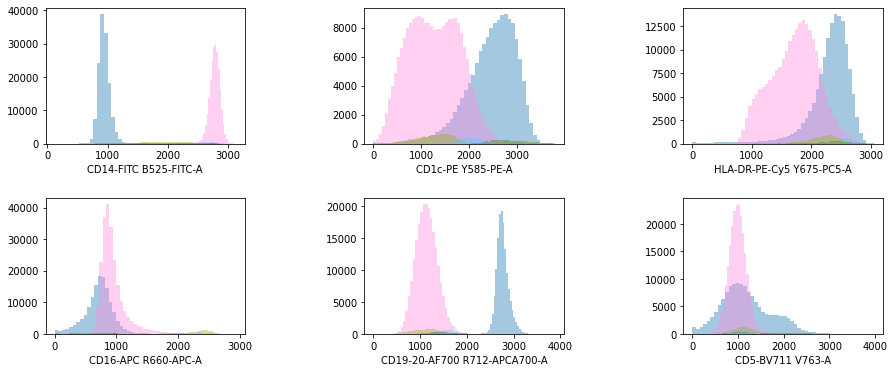

In [607]:
rcParams['figure.figsize']=(15,6)
fig_ind=np.arange(231, 237)
names = adata.var_names
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
for index in enumerate(fig_ind):
    ax = fig.add_subplot(index[1])
    #sb.distplot(adata.X[:,adata.var_names==names[index[0]]], 
    #            kde=False, norm_hist=False, bins=200, 
    #            axlabel=names[index[0]],ax=ax)
    for cluster in enumerate(adata.obs['cell_types_lvl2'].cat.categories):
        if cluster[1]=='not annotated':
            continue
        
        axs = sb.distplot(adata.X[adata.obs['cell_types_lvl2']==cluster[1],
                                           adata.var_names==names[index[0]]], 
                          kde=False, 
                          norm_hist=False, 
                          axlabel=names[index[0]],
                          color=adata.uns['cell_types_lvl2_colors'][cluster[0]])
      #  axs.set_xscale('symlog', linthresh=100)
    #plt.grid(True)

#plt.savefig(fname = './figures/histogram_' + today +  '_all_mono_lympho_types.pdf', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

Remove B-cells, B-cell likes, and neutrophils from the data set and visualise expression of the remainder in scatter plots.

In [608]:
adata.obs['cell_types'].cat.categories

Index(['B cell', 'monocyte', 'dendritic cell', 'not annotated'], dtype='object')

In [609]:
adata_red = adata[np.in1d(adata.obs['cell_types_lvl2'], ['classical monocyte',
       'non-classical monocyte', 'intermediate monocyte', 'dendritic cell Q1',
       'dendritic cell Q3', 'dendritic cell Q4'])].copy()

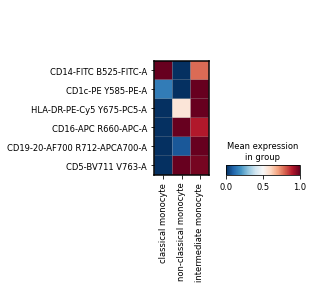

In [610]:
sc.pl.matrixplot(adata_red, groupby='cell_types_lvl2', standard_scale='var', swap_axes=True,
                 var_names=adata.var_names, cmap='RdBu_r', 
                 layer='compensated', log='True', 
                # save='_' + today+'_celltypes_norm_nonB.pdf'
                )

Visualised reduced UMAP.

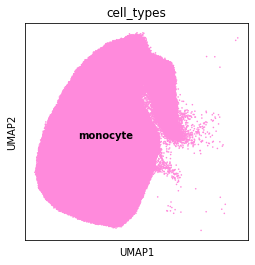

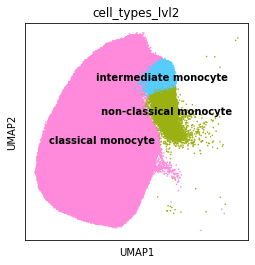

In [611]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_red, color='cell_types', size=10, legend_loc='on data', 
           #save='_'+today + 'monolympho_nonB.png'
          )
sc.pl.umap(adata_red, color='cell_types_lvl2', size=10, legend_loc='on data', 
          # save='_'+today + 'monolympho_refined.png'
          )

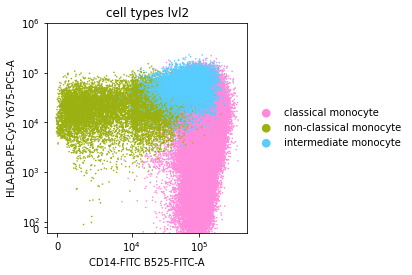

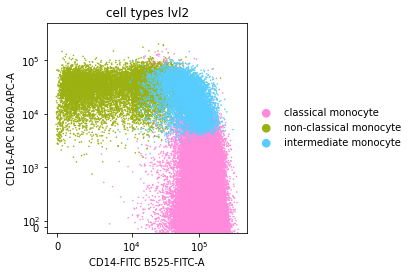

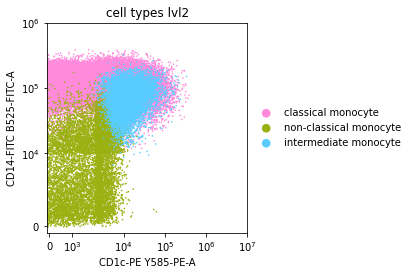

In [612]:
rcParams['figure.figsize']=(4,4)
ax = sc.pl.scatter(adata_red, 'CD14-FITC B525-FITC-A', 'HLA-DR-PE-Cy5 Y675-PC5-A', 
                   layers='compensated',
              #save='_' + today+'_CD14_HLA.png',
              color='cell_types_lvl2', size=10, show=False)
plt.xscale('symlog', linthresh=1e4)
plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
plt.ylim(-1e2, 1e6)
#plt.savefig(fname = './figures/scatter_' + today +  '_nonB_CD14_HLA.png', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()
ax = sc.pl.scatter(adata_red, 'CD14-FITC B525-FITC-A', 'CD16-APC R660-APC-A',
              #save='_' + today+'_CD14_CD16.png',
                   layers='compensated',
              color='cell_types_lvl2', size=10, show=False)
plt.xscale('symlog', linthresh=1e4)
plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
plt.ylim(-1e2, 5e5)
#plt.savefig(fname = './figures/scatter_' + today +  '_nonB_CD14_CD16.png', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()
ax = sc.pl.scatter(adata_red, 'CD1c-PE Y585-PE-A', 'CD14-FITC B525-FITC-A', 
              #save='_' + today+'_CD1c_CD14.png', show=False,
                   layers='compensated',
              color='cell_types_lvl2', size=10, show=False)
plt.xscale('symlog', linthresh=2e3)
plt.yscale('symlog', linthresh=1e4)
plt.xlim(-1e2, 1e7)
plt.ylim(-1e3, 1e6)
#plt.savefig(fname = './figures/scatter_' + today +  '_nonB_CD1c_CD14.png', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()


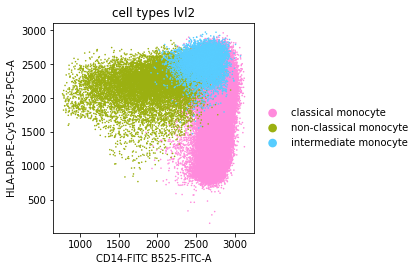

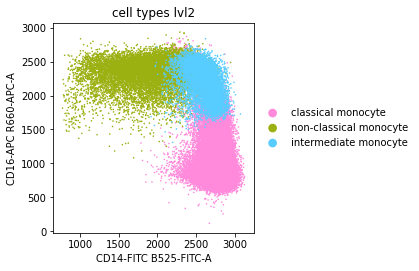

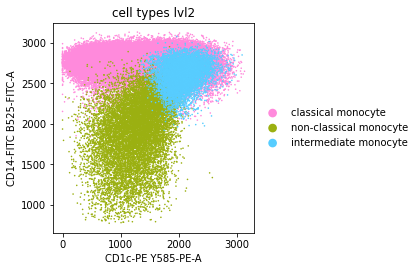

In [613]:
rcParams['figure.figsize']=(4,4)
ax = sc.pl.scatter(adata_red, 'CD14-FITC B525-FITC-A', 'HLA-DR-PE-Cy5 Y675-PC5-A', 
                   #layers='compensated',
              #save='_' + today+'_CD14_HLA.png',
              color='cell_types_lvl2', size=10, show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e2, 1e6)
#plt.savefig(fname = './figures/scatter_' + today +  '_nonB_CD14_HLA.png', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()
ax = sc.pl.scatter(adata_red, 'CD14-FITC B525-FITC-A', 'CD16-APC R660-APC-A',
              #save='_' + today+'_CD14_CD16.png',
              #     layers='compensated',
              color='cell_types_lvl2', size=10, show=False)
#plt.xscale('symlog', linthresh=1e4)
#plt.yscale('symlog', linthresh=1e3)
#plt.xlim(-1e3, 1e6)
#plt.ylim(-1e2, 5e5)
#plt.savefig(fname = './figures/scatter_' + today +  '_nonB_CD14_CD16.png', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()
ax = sc.pl.scatter(adata_red, 'CD1c-PE Y585-PE-A', 'CD14-FITC B525-FITC-A', 
              #save='_' + today+'_CD1c_CD14.png', show=False,
              #     layers='compensated',
              color='cell_types_lvl2', size=10, show=False)
#plt.xscale('symlog', linthresh=2e3)
#plt.yscale('symlog', linthresh=1e4)
#plt.xlim(-1e2, 1e7)
#plt.ylim(-1e3, 1e6)
#plt.savefig(fname = './figures/scatter_' + today +  '_nonB_CD1c_CD14.png', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()


Distributions per parameter separately by cluster.

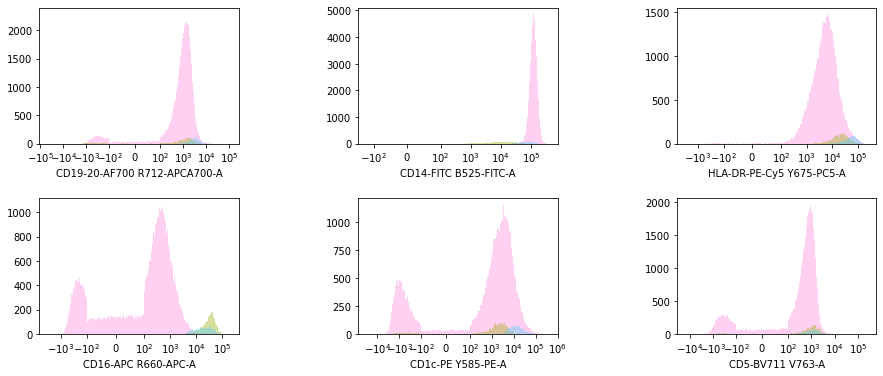

In [614]:
rcParams['figure.figsize']=(15,6)
fig_ind=np.arange(231, 237)
names =[ 'CD19-20-AF700 R712-APCA700-A','CD14-FITC B525-FITC-A','HLA-DR-PE-Cy5 Y675-PC5-A',
        'CD16-APC R660-APC-A',
        'CD1c-PE Y585-PE-A', 'CD5-BV711 V763-A']

fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
for index in enumerate(fig_ind):
    ax = fig.add_subplot(index[1])
    #compute edges
    amin, amax = extrema_np(adata_red.layers['compensated'][:,
                                                        adata_red.var_names==names[index[0]]])
    bin_edges = get_bins(amin, amax, 'symlog')
    for idx in enumerate(adata_red.obs['cell_types_lvl2'].cat.categories):   
        
        axs = sb.distplot(adata_red.layers['compensated'][adata_red.obs['cell_types_lvl2']==idx[1],
                                                             adata_red.var_names==names[index[0]]], 
                          kde=False,
                          norm_hist=False, 
                          bins=bin_edges, 
                          ax=ax, 
                          axlabel=names[index[0]],
                color = adata_red.uns['cell_types_lvl2_colors'][idx[0]])
        axs.set_xscale('symlog', linthresh=100)
    #plt.grid(True)

#plt.savefig(fname = './figures/histogram_' + today +  '_CD1920pos_per_patient.pdf', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()

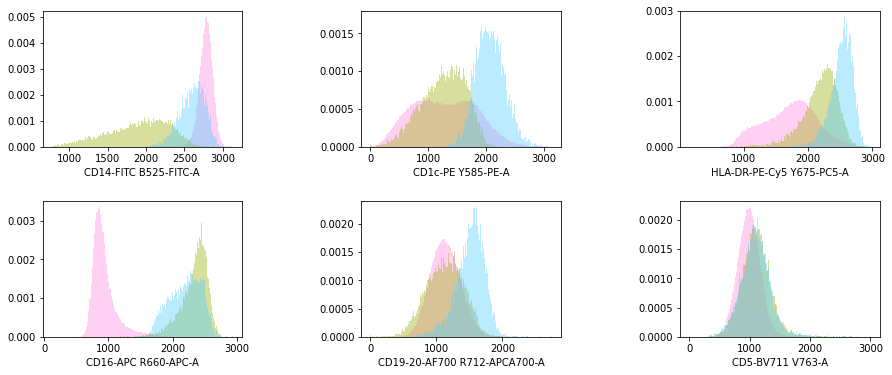

In [615]:
rcParams['figure.figsize']=(15,6)
fig_ind=np.arange(231, 237)
names = adata.var_names
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
for index in enumerate(fig_ind):
    ax = fig.add_subplot(index[1])
    #sb.distplot(adata.X[:,adata.var_names==names[index[0]]], 
    #            kde=False, norm_hist=False, bins=200, 
    #            axlabel=names[index[0]],ax=ax)
    for cluster in enumerate(adata_red.obs['cell_types_lvl2'].cat.categories):
        if cluster[1]=='not annotated':
            continue
        
        axs = sb.distplot(adata_red.X[adata_red.obs['cell_types_lvl2']==cluster[1],
                                           adata_red.var_names==names[index[0]]], 
                          kde=False, 
                          bins=150,
                          norm_hist=True, 
                          axlabel=names[index[0]],
                          color=adata_red.uns['cell_types_lvl2_colors'][cluster[0]])
      #  axs.set_xscale('symlog', linthresh=100)
    #plt.grid(True)

#plt.savefig(fname = './figures/histogram_' + today +  '_all_mono_lympho_types.pdf', 
#            orientation='landscape', bbox_inches='tight', transparent=True)
plt.show()